# Figure out a way to Unite Data

In [67]:
# setwd("/data/park_lab/adam/unite")
# save.image(file = "unite.RData")

In [1]:
setwd("/data/park_lab/adam/unite")
load(file = "unite.RData")
ls()



Registered S3 method overwritten by 'enrichplot':
  method               from
  fortify.enrichResult DOSE



[1] "all_diff_genes"                           
  [2] "AREG_exp"                                 
  [3] "AREG_exp_raw"                             
  [4] "ATAC_E545K_genes"                         
  [5] "ATAC_H1047R_genes"                        
  [6] "ATAC_peak_counts"                         
  [7] "ATAC_peak_counts_reduced"                 
  [8] "ATACPeaks_cleaned"                        
  [9] "ATACPeaks_sorted"                         
 [10] "better_names"                             
 [11] "cancer_coldata"                           
 [12] "cancer_counts"                            
 [13] "cancer_dds"                               
 [14] "cancer_dds_f"                             
 [15] "cancer_diff_genes"                        
 [16] "cancer_E545K_enr_E545KvH1047R"            
 [17] "cancer_E545K_enr_WTvE545K"                
 [18] "cancer_E545KvH1047R_res"                  
 [19] "cancer_ex9vex20_over"                     
 [20] "cancer_ex9vex20_res"                      
 [21] "cancer_ex9vex20_resSig_padj"              
 [22] "cancer_ex9vex20_under"                    
 [23] "cancer_filt"                              
 [24] "cancer_genotype"                          
 [25] "cancer_H1047R_enr_E545KvH1047R"           
 [26] "cancer_H1047R_enr_WTvH1047R"              
 [27] "cancer_norm_sigset"                       
 [28] "cancer_normalized_counts_f"               
 [29] "cancer_normalized_counts_f_nonames"       
 [30] "cancer_rlog"                              
 [31] "cancer_sampleDistMatrix"                  
 [32] "cancer_samples"                           
 [33] "cancer_vst"                               
 [34] "cancer_WT_enr_WTvE545K"                   
 [35] "cancer_WT_enr_WTvH1047R"                  
 [36] "cancer_WTvE545K_res"                      
 [37] "cancer_WTvex20_over"                      
 [38] "cancer_WTvex20_res"                       
 [39] "cancer_WTvex20_resSig_padj"               
 [40] "cancer_WTvex20_under"                     
 [41] "cancer_WTvex9_over"                       
 [42] "cancer_WTvex9_over_clean"                 
 [43] "cancer_WTvex9_over_symbols"               
 [44] "cancer_WTvex9_res"                        
 [45] "cancer_WTvex9_resSig_padj"                
 [46] "cancer_WTvex9_under"                      
 [47] "cancer_WTvex9_under_clean"                
 [48] "cancer_WTvex9_under_symbols"              
 [49] "cancer_WTvH1047R_res"                     
 [50] "cancerDists"                              
 [51] "ChIPseekerEnv"                            
 [52] "cluster_df"                               
 [53] "cluster3"                                 
 [54] "cluster3_genes"                           
 [55] "cluster3_genes_clean"                     
 [56] "cluster3_GOBP"                            
 [57] "cluster9"                                 
 [58] "cluster9_genes"                           
 [59] "cluster9_genes_clean"                     
 [60] "cluster9_GOBP"                            
 [61] "clusters"                                 
 [62] "col_data_cell"                            
 [63] "col_data_geno"                            
 [64] "comparisons"                              
 [65] "datares_HC"                               
 [66] "dds_cell"                                 
 [67] "dds_cell_collapsed"                       
 [68] "dds_geno"                                 
 [69] "dds_geno_collapsed"                       
 [70] "dds_LRT"                                  
 [71] "Diablo_Result_Geno"                       
 [72] "Diablo_Result_Total"                      
 [73] "diff_ex9vex20"                            
 [74] "diff_ex9vex20_sig"                        
 [75] "diff_WTvex20"                             
 [76] "diff_WTvex20_sig"                         
 [77] "diff_WTvex9"                              
 [78] "diff_WTvex9_sig"                          
 [79] "E545K_enr_E545KvH1047R"                   
 [80] "E545K_enr_WTvE545K"                       
 [

Ben-Emily joint meeting 12/8/21
Takeaway was that I need to unite the gene lists from my RNA-seq, the TCGA RNA-seq, and the ATAC-seq data in order to identify genes to perform a CRISPR screen on.

Find the gene lists

## Directories to Gene lists

ATAC gene list from Stepwise Analysis (Promoter annotated regions shared between any two cell lineages not found in WT)

In [15]:
cd /gpfs52/data/park_lab/adam/ATAC/stepwise
ls *geneList*

E545K_geneList.txt  H1047R_geneList.txt


My RNA-seq gene lists

In [19]:
cd /gpfs52/data/park_lab/adam/Total_RNA
ls *unique*

cancer_WTvex20_unique.txt  HTert_WTvex20_unique.txt  MCF10A_WTvex20_unique.txt
cancer_WTvex9_unique.txt   HTert_WTvex9_unique.txt   MCF10A_WTvex9_unique.txt


Differentially Expressed genes from the TCGA-BRCA dataset

In [25]:
cd /gpfs52/data/park_lab/adam/TCGA_BRCA_R
ls TCGA_BRCA.txt

/gpfs52/data/park_lab/adam/TCGA_BRCA_R
TCGA_BRCA.txt


## Data Cleaning

### ATAC-seq

In [4]:
library(tidyverse)
library(biomaRt)
library(org.Hs.eg.db)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.6     ✔ dplyr   1.0.7
✔ tidyr   1.1.4     ✔ stringr 1.4.0
✔ readr   2.1.1     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()  masks stats::filter()
✖ purrr::flatten() masks jsonlite::flatten()
✖ dplyr::lag()     masks stats::lag()

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package

In [18]:
ATAC_E545K_genes <- read_tsv(file = "/gpfs52/data/park_lab/adam/ATAC/stepwise/E545K_geneList.txt")
# ATAC_E545K_genes <- as.data.frame(ATAC_E545K_genes)
ATAC_E545K_genes
ATAC_H1047R_genes <- read_tsv(file = "/gpfs52/data/park_lab/adam/ATAC/stepwise/H1047R_geneList.txt")
# ATAC_H1047R_genes <- as.data.frame(ATAC_H1047R_genes)
ATAC_H1047R_genes

colnames(ATAC_E545K_genes)<- c("Entrez_ID")
# ATAC_E545K_genes <- rbind("1953")
ATAC_E545K_genes
colnames(ATAC_H1047R_genes)<- c("Entrez_ID")
# ATAC_H1047_genes <- rbind("100132074")
ATAC_H1047R_genes

Rows: 5894 Columns: 1

── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
dbl (1): 1953


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.



1953
<dbl>
57449
80176
80176
80176
80176
55187
55187
55187
55187


Rows: 8876 Columns: 1

── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
dbl (1): 100132074


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.



100132074
<dbl>
100132074
100132074
100132074
100132074
100132074
100132074
100132074
59269
59269


Entrez_ID
<dbl>
57449
80176
80176
80176
80176
55187
55187
55187
55187


Entrez_ID
<dbl>
100132074
100132074
100132074
100132074
100132074
100132074
100132074
59269
59269


In [21]:
# ATAC_E545K_genes <- cbind(c("symbol"), ATAC_E545K_genes)
# ATAC_H1047R_genes <- cbind(c("symbol"), ATAC_H1047R_genes)
# names(ATAC_E545K_genes) <- c("symbol", "Entrez_ID")
# names(ATAC_H1047R_genes) <- c("symbol", "Entrez_ID")
ATAC_E545K_genes
ATAC_H1047R_genes
#add back gene that got cut off by colnames
# gene <- data.frame("symbol", "1953")
# names(gene) <- c("symbol", "Entrez_ID")
# gene
# ATAC_E545K_genes <- rbind(ATAC_E545K_genes, gene)
ATAC_E545K_genes
# gene <- data.frame("symbol", "100132074")
# names(gene) <- c("symbol", "Entrez_ID")
# gene
# ATAC_H1047R_genes <- rbind(ATAC_H1047R_genes, gene)
ATAC_H1047R_genes

symbol,Entrez_ID
<fct>,<chr>
symbol,57449
symbol,80176
symbol,80176
symbol,80176
symbol,80176
symbol,55187
symbol,55187
symbol,55187
symbol,55187


symbol,Entrez_ID
<fct>,<chr>
symbol,100132074
symbol,100132074
symbol,100132074
symbol,100132074
symbol,100132074
symbol,100132074
symbol,100132074
symbol,59269
symbol,59269


symbol,Entrez_ID
<fct>,<chr>
symbol,57449
symbol,80176
symbol,80176
symbol,80176
symbol,80176
symbol,55187
symbol,55187
symbol,55187
symbol,55187


symbol,Entrez_ID
<fct>,<chr>
symbol,100132074
symbol,100132074
symbol,100132074
symbol,100132074
symbol,100132074
symbol,100132074
symbol,100132074
symbol,59269
symbol,59269


In [23]:
ATAC_E545K_genes <- ATAC_E545K_genes[!duplicated(ATAC_E545K_genes), ]
ATAC_H1047R_genes <- ATAC_H1047R_genes[!duplicated(ATAC_H1047R_genes), ]

In [24]:
ATAC_E545K_genes
ATAC_H1047R_genes

,symbol,Entrez_ID
,<fct>,<chr>
1,symbol,57449
2,symbol,80176
6,symbol,55187
12,symbol,23254
14,symbol,55160
16,symbol,9923
19,symbol,55616
25,symbol,10163
27,symbol,7049


,symbol,Entrez_ID
,<fct>,<chr>
1,symbol,100132074
8,symbol,59269
10,symbol,10103
15,symbol,10207
17,symbol,149047
18,symbol,3192
19,symbol,114818
20,symbol,3344
23,symbol,56603


In [27]:
entr.str <- substr(ATAC_E545K_genes$Entrez_ID, 1 , 15)
entr.str
ATAC_E545K_genes$symbol <- mapIds(org.Hs.eg.db,
                            keys = entr.str,
                            column = "SYMBOL",
                            keytype = "ENTREZID",
                            multiVals= "first")
ATAC_E545K_genes

[1] "57449"     "80176"     "55187"     "23254"     "55160"     "9923"     
   [7] "55616"     "10163"     "7049"      "126969"    "1301"      "128338"   
  [13] "101927468" "54935"     "339512"    "83540"     "5087"      "4009"     
  [19] "57645"     "2327"      "111240474" "353299"    "116461"    "81563"    
  [25] "100288079" "104169671" "105372894" "5784"      "440714"    "359948"   
  [31] "101927851" "10472"     "101929551" "8853"      "400946"    "388"      
  [37] "2646"      "100129995" "104355288" "5212"      "728730"    "100128590"
  [43] "388942"    "79823"     "107985879" "5581"      "9378"      "100302652"
  [49] "8291"      "56603"     "25885"     "3899"      "11138"     "5455"     
  [55] "2274"      "541471"    "3625"      "2736"      "9394"      "2863"     
  [61] "401014"    "6328"      "6670"      "80856"     "401021"    "151126"   
  [67] "57520"     "130749"    "6168"      "23704"     "55619"     "3667"     
  [73] "25992"     "3708"      "101927394" "100288428" "56852"     "132014"   
  [79] "79750"     "101928015" "285268"    "100847079" "55799"     "7474"     
  [85] "5793"      "9223"      "389136"    "131566"    "214"       "100616129"
  [91] "100506555" "151887"    "105374057" "23129"     "131034"    "5523"     
  [97] "80321"     "5947"      "100507291" "101927808" "92370"     "440982"   
 [103] "7104"      "25976"     "339894"    "2122"      "100874219" "64778"    
 [109] "100505566" "104797538" "51555"     "10644"     "4026"      "7466"     
 [115] "101929071" "152742"    "9079"      "23216"     "81793"     "100506827"
 [121] "8671"      "3576"      "57619"     "10563"     "51316"     "101928978"
 [127] "101929194" "8633"      "105377338" "55024"     "101929577" "27123"    
 [133] "79642"     "8654"      "79633"     "100302267" "100507487" "57484"    
 [139] "100507639" "100505545" "4306"      "54798"     "56034"     "100616234"
 [145] "105377573" "55714"     "105377600" "56172"     "105374698" "4883"     
 [151] "114899"    "133418"    "79668"     "5144"      "9607"      "102477328"
 [157] "10085"     "83989"     "317671"    "285704"    "1946"      "134429"   
 [163] "4163"      "101927379" "103724389" "101927421" "728586"    "51265"    
 [169] "340073"    "23092"     "6444"      "2299"      "2568"      "100847029"
 [175] "101928154" "1812"      "1212"      "643836"    "347733"    "401237"   
 [181] "154150"    "100507173" "2880"      "387055"    "401242"    "25803"    
 [187] "647024"    "8464"      "266977"    "221357"    "55227"     "81578"    
 [193] "101928601" "55603"     "3354"      "5454"      "6492"      "222537"   
 [199] "245806"    "5570"      "154215"    "2037"      "110806279" "100500879"
 [205] "7402"      "26271"     "94120"     "51660"     "23288"     "7291"     
 [211] "646588"    "9586"      "168667"    "554236"    "79783"     "23242"    
 [217] "2631"      "2770"      "346562"    "1780"      "285987"    "1749"     
 [223] "1738"      "10447"     "346653"    "51650"     "100507421" "100463482"
 [229] "51422"     "79648"     "101929229" "23362"     "203069"    "728024"   
 [235] "11212"     "6575"      "23514"     "1392"      "116328"    "6383"     
 [241] "157680"    "8323"      "169026"    "90390"     "100302281" "5339"     
 [247] "6595"      "10171"     "8777"      "100113404" "6619"      "203238"   
 [253] "54796"     "25769"     "100616441" "51754"     "5125"      "2650"     
 [259] "1612"      "54829"     "286204"    "100151684" "286256"    "101927880"
 [265] "105755953" "340895"    "1326"      "2662"      "23283"     "11130"    
 [271] "253430"    "9886"      "414236"    "3988"      "5507"      "93377"    
 [277] "101927472" "101927549" "100505933" "390003"    "6144"      "51363"    
 [283] "402778"    "10346"     "6764"      "338645"    "341019"    "57689"    
 [289] "747"       "745"       "23649"     "26579"     "7352"      "100873989"
 [295] "120114"    "143684"    "84441"     "53942"     "143872"    "114908"   
 [301] "4321"      "2977"      "23086"     "1662"    

'select()' returned 1:1 mapping between keys and columns



,symbol,Entrez_ID
,<chr>,<chr>
1,PLEKHG5,57449
2,SPSB1,80176
6,VPS13D,55187
12,KAZN,23254
14,ARHGEF10L,55160
16,ZBTB40,9923
19,ASAP3,55616
25,WASF2,10163
27,TGFBR3,7049


In [28]:
entr.str <- substr(ATAC_H1047R_genes$Entrez_ID, 1 , 15)
entr.str
ATAC_H1047R_genes$symbol <- mapIds(org.Hs.eg.db,
                            keys = entr.str,
                            column = "SYMBOL",
                            keytype = "ENTREZID",
                            multiVals= "first")
ATAC_H1047R_genes

[1] "100132074" "59269"     "10103"     "10207"     "149047"    "3192"     
   [7] "114818"    "3344"      "56603"     "65055"     "100506328" "55137"    
  [13] "5915"      "100133461" "8310"      "132789"    "80157"     "102465138"
  [19] "728095"    "94081"     "102577426" "2766"      "105374956" "105374988"
  [25] "7738"      "100507173" "100463487" "2534"      "100131814" "9844"     
  [31] "7461"      "100507156" "100505676" "286094"    "203238"    "27019"    
  [37] "4783"      "83938"     "283050"    "9644"      "7511"      "27250"    
  [43] "4544"      "120103"    "5450"      "5805"      "219855"    "10867"    
  [49] "9543"      "4088"      "64506"     "145978"    "100506172" "83716"    
  [55] "125058"    "63895"     "1000"      "115701"    "434"       "391257"   
  [61] "100302149" "23313"     "777"       "3099"      "64002"     "79750"    
  [67] "9942"      "200916"    "23142"     "83478"     "100093630" "101927516"
  [73] "101929423" "56133"     "4885"      "7982"      "55790"     "157855"   
  [79] "100423015" "6934"      "6506"      "22822"     "8499"      "196472"   
  [85] "400360"    "100287616" "5923"      "8128"      "100130480" "100505663"
  [91] "105378586" "643988"    "100422975" "407040"    "2048"      "100506985"
  [97] "1996"      "1718"      "414927"    "57685"     "3595"      "79961"    
 [103] "148281"    "100996263" "1942"      "5087"      "4009"      "51430"    
 [109] "9674"      "101928778" "100616328" "83872"     "105371673" "9283"     
 [115] "7832"      "23380"     "1063"      "51133"     "7042"      "104472714"
 [121] "128178"    "391190"    "129787"    "7260"      "9687"      "57665"    
 [127] "8884"      "81606"     "92291"     "91461"     "339807"    "10438"    
 [133] "129293"    "7844"      "4118"      "64965"     "2736"      "2863"     
 [139] "22930"     "7852"      "8942"      "55843"     "92"        "56475"    
 [145] "90134"     "7456"      "518"       "50940"     "151126"    "3685"     
 [151] "84128"     "255101"    "130367"    "7857"      "5270"      "100847053"
 [157] "116987"    "100126791" "859"       "9901"      "391518"    "152110"   
 [163] "105377007" "7048"      "23171"     "105377031" "55129"     "7867"     
 [169] "54106"     "776"       "80145"     "166336"    "6091"      "285220"   
 [175] "11259"     "55076"     "100616129" "54847"     "286676"    "84561"    
 [181] "10840"     "23129"     "27032"     "64084"     "205428"    "152118"   
 [187] "79674"     "51068"     "101243545" "26996"     "64778"     "8743"     
 [193] "57552"     "22871"     "100874245" "79718"     "100505566" "104797538"
 [199] "105374244" "2119"      "105374285" "100126321" "10460"     "152"      
 [205] "54436"     "105374561" "55286"     "23284"     "7366"      "7365"     
 [211] "79799"     "258"       "100505875" "153020"    "84803"     "345274"   
 [217] "101929194" "64116"     "101929577" "27123"     "55013"     "817"      
 [223] "9871"      "171024"    "79931"     "100302267" "101927359" "132430"   
 [229] "100505545" "79658"     "100996286" "55294"     "201799"    "303"      
 [235] "2982"      "4886"      "101930370" "80014"     "2195"      "23379"    
 [241] "23037"     "54545"     "2690"      "102723839" "54622"     "101928448"
 [247] "101928569" "11174"     "101928769" "100505878" "645323"    "102467214"
 [253] "4163"      "100505811" "93166"     "153241"    "103724389" "100616175"
 [259] "7416"      "56142"     "9685"      "1879"      "2566"      "23286"    
 [265] "79646"     "101928176" "10636"     "23138"     "64777"     "9794"     
 [271] "83732"     "101928309" "54438"     "10048"     "10486"     "10279"    
 [277] "50619"     "60685"     "53405"     "101927082" "346007"    "105377860"
 [283] "5570"      "7402"      "22828"     "56975"     "115330"    "202915"   
 [289] "3382"      "79150"     "54664"     "196"       "222894"    "100874041"
 [295] "11097"     "9865"      "100506497" "358"       "168667"    "101928618"
 [301] "79020"     "83605"     "222008"    "728927"  

'select()' returned 1:1 mapping between keys and columns



,symbol,Entrez_ID
,<chr>,<chr>
1,FOXO6,100132074
8,HIVEP3,59269
10,TSPAN1,10103
15,PATJ,10207
17,MGC27382,149047
18,HNRNPU,3192
19,KLHL29,114818
20,FOXN2,3344
23,CYP26B1,56603


In [29]:
ATAC_E545K_genes
ATAC_H1047R_genes

,symbol,Entrez_ID
,<chr>,<chr>
1,PLEKHG5,57449
2,SPSB1,80176
6,VPS13D,55187
12,KAZN,23254
14,ARHGEF10L,55160
16,ZBTB40,9923
19,ASAP3,55616
25,WASF2,10163
27,TGFBR3,7049


,symbol,Entrez_ID
,<chr>,<chr>
1,FOXO6,100132074
8,HIVEP3,59269
10,TSPAN1,10103
15,PATJ,10207
17,MGC27382,149047
18,HNRNPU,3192
19,KLHL29,114818
20,FOXN2,3344
23,CYP26B1,56603


### My RNA-seq

In [31]:
setwd("/gpfs52/data/park_lab/adam/Total_RNA")

In [3]:
myRNA_cancer_WTvex9 <- read_tsv(file = "cancer_WTvex9_unique.txt")
myRNA_cancer_WTvex20 <- read_tsv(file = "cancer_WTvex20_unique.txt")
myRNA_HTert_WTvex9 <- read_tsv(file = "HTert_WTvex9_unique.txt")
myRNA_HTert_WTvex20 <- read_tsv(file = "HTert_WTvex20_unique.txt")
myRNA_MCF10A_WTvex9 <- read_tsv(file = "MCF10A_WTvex9_unique.txt")
myRNA_MCF10A_WTvex20 <- read_tsv(file = "MCF10A_WTvex20_unique.txt")

myRNA_cancer_WTvex9
myRNA_cancer_WTvex20
myRNA_HTert_WTvex9
myRNA_HTert_WTvex20
myRNA_MCF10A_WTvex9
myRNA_MCF10A_WTvex20

ERROR: Error: 'cancer_WTvex9_unique.txt' does not exist in current working directory ('/gpfs52/data/park_lab/adam/unite').


In [5]:
myRNA_list <- list(myRNA_cancer_WTvex9, myRNA_cancer_WTvex20,
                  myRNA_HTert_WTvex9, myRNA_HTert_WTvex20,
                  myRNA_MCF10A_WTvex9, myRNA_MCF10A_WTvex20)
names(myRNA_list) <- c("myRNA_cancer_WTvex9", "myRNA_cancer_WTvex20",
                  "myRNA_HTert_WTvex9", "myRNA_HTert_WTvex20",
                  "myRNA_MCF10A_WTvex9", "myRNA_MCF10A_WTvex20")
myRNA_list

rowname,log2FoldChange
<chr>,<dbl>
ENSG00000273443.1,1.644451
ENSG00000230415.1,1.550934
ENSG00000225285.1,1.611010
ENSG00000231050.1,1.783544
ENSG00000162490.7,-1.624590
ENSG00000175206.10,2.075728
ENSG00000142619.4,1.532092
ENSG00000163873.10,2.604263
ENSG00000261798.1,1.835625


In [17]:
myRNA_list_symbols <- list()
names(myRNA_list)
for (i in 1:length(myRNA_list)) {
    gene_list <- myRNA_list[[i]]$rowname
    ens.str <- substr(x = gene_list, 1 , 15)
    symbol_col <- mapIds(org.Hs.eg.db,
                         keys = ens.str,
                         column = "SYMBOL",
                         keytype = "ENSEMBL",
                         multiVals= "first")
    myRNA_list_symbols[[i]] <- cbind(myRNA_list[[i]], symbol_col)
}
names(myRNA_list_symbols) <- names(myRNA_list)
myRNA_list_symbols

[1] "myRNA_cancer_WTvex9"  "myRNA_cancer_WTvex20" "myRNA_HTert_WTvex9"  
[4] "myRNA_HTert_WTvex20"  "myRNA_MCF10A_WTvex9"  "myRNA_MCF10A_WTvex20"

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns



,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<fct>
ENSG00000273443,ENSG00000273443.1,1.644451,NA
ENSG00000230415,ENSG00000230415.1,1.550934,NA
ENSG00000225285,ENSG00000225285.1,1.611010,NA
ENSG00000231050,ENSG00000231050.1,1.783544,NA
ENSG00000162490,ENSG00000162490.7,-1.624590,DRAXIN
ENSG00000175206,ENSG00000175206.10,2.075728,NPPA
ENSG00000142619,ENSG00000142619.4,1.532092,PADI3
ENSG00000163873,ENSG00000163873.10,2.604263,GRIK3
ENSG00000261798,ENSG00000261798.1,1.835625,LOC101929536


In [19]:
myRNA_list_symbols_noNA <- lapply(myRNA_list_symbols, na.omit)
myRNA_list_symbols_noNA

,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<fct>
ENSG00000162490,ENSG00000162490.7,-1.624590,DRAXIN
ENSG00000175206,ENSG00000175206.10,2.075728,NPPA
ENSG00000142619,ENSG00000142619.4,1.532092,PADI3
ENSG00000163873,ENSG00000163873.10,2.604263,GRIK3
ENSG00000261798,ENSG00000261798.1,1.835625,LOC101929536
ENSG00000092621,ENSG00000092621.12,-1.624275,PHGDH
ENSG00000169418,ENSG00000169418.10,3.116548,NPR1
ENSG00000027869,ENSG00000027869.11,-3.485829,SH2D2A
ENSG00000196890,ENSG00000196890.4,1.685849,H2BU1


### The TCGA Breast Cancer Data

In [20]:
setwd("/gpfs52/data/park_lab/adam/TCGA_BRCA_R")
TCGA_BRCA_genes <- read_tsv(file = "TCGA_BRCA.txt") %>%
                    as.data.frame()
TCGA_BRCA_genes

Rows: 128 Columns: 9

── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): geneID, diffexpressed, hgnc_symbol
dbl (6): baseMean, log2FoldChange, lfcSE, stat, pvalue, padj


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.



geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000009709,69.2139556,-2.667785,0.5844644,-4.564495,5.006973e-06,2.857472e-03,H1047R,PAX7
ENSG00000011677,29.0964370,-2.506224,0.4704824,-5.326925,9.988943e-08,1.455620e-04,H1047R,GABRA3
ENSG00000084674,40.5732007,-1.540493,0.3634675,-4.238325,2.251935e-05,7.900123e-03,H1047R,APOB
ENSG00000088386,31.5592308,-2.348045,0.3175324,-7.394663,1.417673e-13,1.790427e-09,H1047R,SLC15A1
ENSG00000089199,175.9848799,-3.958900,0.4375698,-9.047471,1.463177e-19,5.543684e-15,H1047R,CHGB
ENSG00000101204,5.7439871,-1.959132,0.5148624,-3.805156,1.417148e-04,2.567687e-02,H1047R,CHRNA4
ENSG00000112175,75.4926435,-1.600991,0.3485600,-4.593157,4.365894e-06,2.584609e-03,H1047R,BMP5
ENSG00000118733,2.9301007,-2.091694,0.5520490,-3.788964,1.512766e-04,2.678997e-02,H1047R,OLFM3
ENSG00000121742,19.3176086,-1.801993,0.3549033,-5.077419,3.825957e-07,3.814680e-04,H1047R,GJB6


In [21]:
TCGA_BRCA_genes_noNA <- na.omit(TCGA_BRCA_genes)
TCGA_BRCA_genes_noNA

,geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,ENSG00000009709,69.2139556,-2.667785,0.5844644,-4.564495,5.006973e-06,2.857472e-03,H1047R,PAX7
2,ENSG00000011677,29.0964370,-2.506224,0.4704824,-5.326925,9.988943e-08,1.455620e-04,H1047R,GABRA3
3,ENSG00000084674,40.5732007,-1.540493,0.3634675,-4.238325,2.251935e-05,7.900123e-03,H1047R,APOB
4,ENSG00000088386,31.5592308,-2.348045,0.3175324,-7.394663,1.417673e-13,1.790427e-09,H1047R,SLC15A1
5,ENSG00000089199,175.9848799,-3.958900,0.4375698,-9.047471,1.463177e-19,5.543684e-15,H1047R,CHGB
6,ENSG00000101204,5.7439871,-1.959132,0.5148624,-3.805156,1.417148e-04,2.567687e-02,H1047R,CHRNA4
7,ENSG00000112175,75.4926435,-1.600991,0.3485600,-4.593157,4.365894e-06,2.584609e-03,H1047R,BMP5
8,ENSG00000118733,2.9301007,-2.091694,0.5520490,-3.788964,1.512766e-04,2.678997e-02,H1047R,OLFM3
9,ENSG00000121742,19.3176086,-1.801993,0.3549033,-5.077419,3.825957e-07,3.814680e-04,H1047R,GJB6


## Unite the Data

Objects for all three data sets

In [2]:
#These are the genes for my RNA seq data
myRNA_list_symbols_noNA
#These are the genes with differentially accessible promoters from my ATAC-seq
ATAC_E545K_genes
ATAC_H1047R_genes
#These are the genes found to be differentially accessible between samples in
#the TCGA-BRCA database with these mutations
TCGA_BRCA_genes_noNA

,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<fct>
ENSG00000162490,ENSG00000162490.7,-1.624590,DRAXIN
ENSG00000175206,ENSG00000175206.10,2.075728,NPPA
ENSG00000142619,ENSG00000142619.4,1.532092,PADI3
ENSG00000163873,ENSG00000163873.10,2.604263,GRIK3
ENSG00000261798,ENSG00000261798.1,1.835625,LOC101929536
ENSG00000092621,ENSG00000092621.12,-1.624275,PHGDH
ENSG00000169418,ENSG00000169418.10,3.116548,NPR1
ENSG00000027869,ENSG00000027869.11,-3.485829,SH2D2A
ENSG00000196890,ENSG00000196890.4,1.685849,H2BU1


,symbol,Entrez_ID
,<chr>,<chr>
1,PLEKHG5,57449
2,SPSB1,80176
6,VPS13D,55187
12,KAZN,23254
14,ARHGEF10L,55160
16,ZBTB40,9923
19,ASAP3,55616
25,WASF2,10163
27,TGFBR3,7049


,symbol,Entrez_ID
,<chr>,<chr>
1,FOXO6,100132074
8,HIVEP3,59269
10,TSPAN1,10103
15,PATJ,10207
17,MGC27382,149047
18,HNRNPU,3192
19,KLHL29,114818
20,FOXN2,3344
23,CYP26B1,56603


,geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,ENSG00000009709,69.2139556,-2.667785,0.5844644,-4.564495,5.006973e-06,2.857472e-03,H1047R,PAX7
2,ENSG00000011677,29.0964370,-2.506224,0.4704824,-5.326925,9.988943e-08,1.455620e-04,H1047R,GABRA3
3,ENSG00000084674,40.5732007,-1.540493,0.3634675,-4.238325,2.251935e-05,7.900123e-03,H1047R,APOB
4,ENSG00000088386,31.5592308,-2.348045,0.3175324,-7.394663,1.417673e-13,1.790427e-09,H1047R,SLC15A1
5,ENSG00000089199,175.9848799,-3.958900,0.4375698,-9.047471,1.463177e-19,5.543684e-15,H1047R,CHGB
6,ENSG00000101204,5.7439871,-1.959132,0.5148624,-3.805156,1.417148e-04,2.567687e-02,H1047R,CHRNA4
7,ENSG00000112175,75.4926435,-1.600991,0.3485600,-4.593157,4.365894e-06,2.584609e-03,H1047R,BMP5
8,ENSG00000118733,2.9301007,-2.091694,0.5520490,-3.788964,1.512766e-04,2.678997e-02,H1047R,OLFM3
9,ENSG00000121742,19.3176086,-1.801993,0.3549033,-5.077419,3.825957e-07,3.814680e-04,H1047R,GJB6


### Is any gene present in all datasets?

Make a big gene list from my RNA for the first overlap

In [5]:
myRNA_bigList <- bind_rows(myRNA_list_symbols_noNA, .id = "rowname")
myRNA_bigList

,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<fct>
ENSG00000162490,myRNA_cancer_WTvex9,-1.624590,DRAXIN
ENSG00000175206,myRNA_cancer_WTvex9,2.075728,NPPA
ENSG00000142619...3,myRNA_cancer_WTvex9,1.532092,PADI3
ENSG00000163873,myRNA_cancer_WTvex9,2.604263,GRIK3
ENSG00000261798,myRNA_cancer_WTvex9,1.835625,LOC101929536
ENSG00000092621...6,myRNA_cancer_WTvex9,-1.624275,PHGDH
ENSG00000169418...7,myRNA_cancer_WTvex9,3.116548,NPR1
ENSG00000027869...8,myRNA_cancer_WTvex9,-3.485829,SH2D2A
ENSG00000196890,myRNA_cancer_WTvex9,1.685849,H2BU1


Make a big list from ATAC data

In [7]:
ATAC_bigList <- rbind(ATAC_E545K_genes, ATAC_H1047R_genes)
ATAC_bigList

,symbol,Entrez_ID
,<chr>,<chr>
1,PLEKHG5,57449
2,SPSB1,80176
6,VPS13D,55187
12,KAZN,23254
14,ARHGEF10L,55160
16,ZBTB40,9923
19,ASAP3,55616
25,WASF2,10163
27,TGFBR3,7049


In [28]:
Genes_inAll <- intersect(intersect(myRNA_bigList$symbol_col,
                                   ATAC_bigList$symbol),
                         TCGA_BRCA_genes_noNA$hgnc_symbol)
Genes_inAll

[1] "S100A8"  "CCDC190" "AKR1B15"

Find Those genes to determine where they come from

In [29]:
myRNA_S100A8 <- myRNA_bigList %>%
                dplyr::filter(symbol_col == "S100A8")
myRNA_CCDC190 <- myRNA_bigList %>%
                dplyr::filter(symbol_col == "CCDC190")
myRNA_AKR1B15 <- myRNA_bigList %>%
                dplyr::filter(symbol_col == "AKR1B15")
myRNA_S100A8
myRNA_CCDC190
myRNA_AKR1B15

,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<fct>
ENSG00000143546,myRNA_HTert_WTvex9,2.230439,S100A8


,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<fct>
ENSG00000185860,myRNA_HTert_WTvex9,-2.900492,CCDC190


,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<fct>
ENSG00000227471,myRNA_MCF10A_WTvex20,-2.713391,AKR1B15


In [30]:
ATAC_S100A8_E545K <- ATAC_E545K_genes %>%
                dplyr::filter(symbol == "S100A8")
ATAC_S100A8_H1047R <- ATAC_H1047R_genes %>%
                dplyr::filter(symbol == "S100A8")
ATAC_CCDC190_E545K <- ATAC_E545K_genes %>%
                dplyr::filter(symbol == "CCDC190")
ATAC_CCDC190_H1047R <- ATAC_H1047R_genes %>%
                dplyr::filter(symbol == "CCDC190")
ATAC_AKR1B15_E545K <- ATAC_E545K_genes %>%
                dplyr::filter(symbol == "AKR1B15")
ATAC_AKR1B15_H1047R <- ATAC_H1047R_genes %>%
                dplyr::filter(symbol == "AKR1B15")
ATAC_S100A8_E545K
ATAC_S100A8_H1047R
ATAC_CCDC190_E545K
ATAC_CCDC190_H1047R
ATAC_AKR1B15_E545K
ATAC_AKR1B15_H1047R

symbol,Entrez_ID
<chr>,<chr>


symbol,Entrez_ID
<chr>,<chr>
S100A8,6279


symbol,Entrez_ID
<chr>,<chr>
CCDC190,339512


symbol,Entrez_ID
<chr>,<chr>
CCDC190,339512


symbol,Entrez_ID
<chr>,<chr>
AKR1B15,441282


symbol,Entrez_ID
<chr>,<chr>


In [32]:
TCGA_S100A8 <- TCGA_BRCA_genes_noNA %>%
            dplyr::filter(hgnc_symbol == "S100A8")
TCGA_CCDC190 <- TCGA_BRCA_genes_noNA %>%
            dplyr::filter(hgnc_symbol == "CCDC190")
TCGA_AKR1B15 <- TCGA_BRCA_genes_noNA %>%
            dplyr::filter(hgnc_symbol == "AKR1B15")
TCGA_S100A8
TCGA_CCDC190
TCGA_AKR1B15

geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000143546,983.5587,-2.293845,0.3315394,-6.918771,4.555776e-12,3.452185e-08,H1047R,S100A8


geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000185860,5.591146,-2.202911,0.4492127,-4.903939,9.393386e-07,0.0007908813,H1047R,CCDC190


geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000227471,201.2767,1.506535,0.3524419,4.274564,1.915115e-05,0.007255986,E545K,AKR1B15


### What about in any two?

In [8]:
myRNA_bigList
ATAC_bigList
TCGA_BRCA_genes_noNA

,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<fct>
ENSG00000162490,myRNA_cancer_WTvex9,-1.624590,DRAXIN
ENSG00000175206,myRNA_cancer_WTvex9,2.075728,NPPA
ENSG00000142619...3,myRNA_cancer_WTvex9,1.532092,PADI3
ENSG00000163873,myRNA_cancer_WTvex9,2.604263,GRIK3
ENSG00000261798,myRNA_cancer_WTvex9,1.835625,LOC101929536
ENSG00000092621...6,myRNA_cancer_WTvex9,-1.624275,PHGDH
ENSG00000169418...7,myRNA_cancer_WTvex9,3.116548,NPR1
ENSG00000027869...8,myRNA_cancer_WTvex9,-3.485829,SH2D2A
ENSG00000196890,myRNA_cancer_WTvex9,1.685849,H2BU1


,symbol,Entrez_ID
,<chr>,<chr>
1,PLEKHG5,57449
2,SPSB1,80176
6,VPS13D,55187
12,KAZN,23254
14,ARHGEF10L,55160
16,ZBTB40,9923
19,ASAP3,55616
25,WASF2,10163
27,TGFBR3,7049


,geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,diffexpressed,hgnc_symbol
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,ENSG00000009709,69.2139556,-2.667785,0.5844644,-4.564495,5.006973e-06,2.857472e-03,H1047R,PAX7
2,ENSG00000011677,29.0964370,-2.506224,0.4704824,-5.326925,9.988943e-08,1.455620e-04,H1047R,GABRA3
3,ENSG00000084674,40.5732007,-1.540493,0.3634675,-4.238325,2.251935e-05,7.900123e-03,H1047R,APOB
4,ENSG00000088386,31.5592308,-2.348045,0.3175324,-7.394663,1.417673e-13,1.790427e-09,H1047R,SLC15A1
5,ENSG00000089199,175.9848799,-3.958900,0.4375698,-9.047471,1.463177e-19,5.543684e-15,H1047R,CHGB
6,ENSG00000101204,5.7439871,-1.959132,0.5148624,-3.805156,1.417148e-04,2.567687e-02,H1047R,CHRNA4
7,ENSG00000112175,75.4926435,-1.600991,0.3485600,-4.593157,4.365894e-06,2.584609e-03,H1047R,BMP5
8,ENSG00000118733,2.9301007,-2.091694,0.5520490,-3.788964,1.512766e-04,2.678997e-02,H1047R,OLFM3
9,ENSG00000121742,19.3176086,-1.801993,0.3549033,-5.077419,3.825957e-07,3.814680e-04,H1047R,GJB6


In [16]:
Genes_inAny2 <- c(intersect(myRNA_bigList$symbol_col,
                                   ATAC_bigList$symbol),
                      intersect(TCGA_BRCA_genes_noNA$hgnc_symbol, 
                                myRNA_bigList$symbol_col),
                      intersect(TCGA_BRCA_genes_noNA$hgnc_symbol,
                               ATAC_bigList$symbol))
str(Genes_inAny2)

 chr [1:1150] "FAM171B" "LINC01807" "ITGA9" "CSRNP1" "ADGRL3" "UNC5C" ...


In [17]:
Genes_inAny2 <- unique(Genes_inAny2)
str(Genes_inAny2)

 chr [1:1144] "FAM171B" "LINC01807" "ITGA9" "CSRNP1" "ADGRL3" "UNC5C" ...


In [21]:
setwd("/data/park_lab/adam/Total_RNA")
full_brunello <- read_tsv(file = "broadgpp-brunello-library-contents.txt")
as.data.frame(full_brunello)
full_brunello

Rows: 77441 Columns: 11

── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (7): Target Gene Symbol, Target Transcript, Genomic Sequence, Strand, sg...
dbl (4): Target Gene ID, Position of Base After Cut (1-based), Exon Number, ...


ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.



Target Gene ID,Target Gene Symbol,Target Transcript,Genomic Sequence,Position of Base After Cut (1-based),Strand,sgRNA Target Sequence,Target Context Sequence,PAM Sequence,Exon Number,Rule Set 2 score
<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
1,A1BG,NM_130786.3,NC_000019.10,58351502,sense,CATCTTCTTTCACCTGAACG,ATCGCATCTTCTTTCACCTGAACGCGGTGG,CGG,5,0.6165
1,A1BG,NM_130786.3,NC_000019.10,58350637,antisense,CTCCGGGGAGAACTCCGGCG,CCGGCTCCGGGGAGAACTCCGGCGCGGGCA,CGG,6,0.6176
1,A1BG,NM_130786.3,NC_000019.10,58351668,antisense,TCTCCATGGTGCATCAGCAC,GGACTCTCCATGGTGCATCAGCACAGGCGG,AGG,5,0.5264
1,A1BG,NM_130786.3,NC_000019.10,58351593,antisense,TGGAAGTCCACTCCACTCAG,TAGCTGGAAGTCCACTCCACTCAGGGGAGC,GGG,5,0.7156
2,A2M,NM_000014.4,NC_000012.12,9090399,sense,ACTGCATCTGTGCAAACGGG,CCTCACTGCATCTGTGCAAACGGGCGGCAA,CGG,20,0.6765
2,A2M,NM_000014.4,NC_000012.12,9101535,sense,ATGTCTCATGAACTACCCTG,GCCCATGTCTCATGAACTACCCTGTGGCCA,TGG,12,0.7487
2,A2M,NM_000014.4,NC_000012.12,9106521,sense,TGAAATGAAACTTCACACTG,AGTATGAAATGAAACTTCACACTGAGGCCC,AGG,9,0.7676
2,A2M,NM_000014.4,NC_000012.12,9110031,sense,TTACTCATATAGGATCCCAA,TAATTTACTCATATAGGATCCCAAAGGAAA,AGG,6,0.6898
9,NAT1,NM_000662.7,NC_000008.11,18222483,antisense,CGGAAGACACAAGGCACCTG,CAAACGGAAGACACAAGGCACCTGAGGCTG,AGG,3,0.5975


Target Gene ID,Target Gene Symbol,Target Transcript,Genomic Sequence,Position of Base After Cut (1-based),Strand,sgRNA Target Sequence,Target Context Sequence,PAM Sequence,Exon Number,Rule Set 2 score
<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
1,A1BG,NM_130786.3,NC_000019.10,58351502,sense,CATCTTCTTTCACCTGAACG,ATCGCATCTTCTTTCACCTGAACGCGGTGG,CGG,5,0.6165
1,A1BG,NM_130786.3,NC_000019.10,58350637,antisense,CTCCGGGGAGAACTCCGGCG,CCGGCTCCGGGGAGAACTCCGGCGCGGGCA,CGG,6,0.6176
1,A1BG,NM_130786.3,NC_000019.10,58351668,antisense,TCTCCATGGTGCATCAGCAC,GGACTCTCCATGGTGCATCAGCACAGGCGG,AGG,5,0.5264
1,A1BG,NM_130786.3,NC_000019.10,58351593,antisense,TGGAAGTCCACTCCACTCAG,TAGCTGGAAGTCCACTCCACTCAGGGGAGC,GGG,5,0.7156
2,A2M,NM_000014.4,NC_000012.12,9090399,sense,ACTGCATCTGTGCAAACGGG,CCTCACTGCATCTGTGCAAACGGGCGGCAA,CGG,20,0.6765
2,A2M,NM_000014.4,NC_000012.12,9101535,sense,ATGTCTCATGAACTACCCTG,GCCCATGTCTCATGAACTACCCTGTGGCCA,TGG,12,0.7487
2,A2M,NM_000014.4,NC_000012.12,9106521,sense,TGAAATGAAACTTCACACTG,AGTATGAAATGAAACTTCACACTGAGGCCC,AGG,9,0.7676
2,A2M,NM_000014.4,NC_000012.12,9110031,sense,TTACTCATATAGGATCCCAA,TAATTTACTCATATAGGATCCCAAAGGAAA,AGG,6,0.6898
9,NAT1,NM_000662.7,NC_000008.11,18222483,antisense,CGGAAGACACAAGGCACCTG,CAAACGGAAGACACAAGGCACCTGAGGCTG,AGG,3,0.5975


In [27]:
better_names <- make.names(names(full_brunello))
better_names
names(full_brunello) <- better_names
names(full_brunello)

[1] "Target.Gene.ID"                      
 [2] "Target.Gene.Symbol"                  
 [3] "Target.Transcript"                   
 [4] "Genomic.Sequence"                    
 [5] "Position.of.Base.After.Cut..1.based."
 [6] "Strand"                              
 [7] "sgRNA.Target.Sequence"               
 [8] "Target.Context.Sequence"             
 [9] "PAM.Sequence"                        
[10] "Exon.Number"                         
[11] "Rule.Set.2.score"

[1] "Target.Gene.ID"                      
 [2] "Target.Gene.Symbol"                  
 [3] "Target.Transcript"                   
 [4] "Genomic.Sequence"                    
 [5] "Position.of.Base.After.Cut..1.based."
 [6] "Strand"                              
 [7] "sgRNA.Target.Sequence"               
 [8] "Target.Context.Sequence"             
 [9] "PAM.Sequence"                        
[10] "Exon.Number"                         
[11] "Rule.Set.2.score"

In [28]:
my_guides <- full_brunello %>%
            subset(Target.Gene.Symbol %in% Genes_inAny2)
my_guides

Target.Gene.ID,Target.Gene.Symbol,Target.Transcript,Genomic.Sequence,Position.of.Base.After.Cut..1.based.,Strand,sgRNA.Target.Sequence,Target.Context.Sequence,PAM.Sequence,Exon.Number,Rule.Set.2.score
<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
9,NAT1,NM_000662.7,NC_000008.11,18222483,antisense,CGGAAGACACAAGGCACCTG,CAAACGGAAGACACAAGGCACCTGAGGCTG,AGG,3,0.5975
9,NAT1,NM_000662.7,NC_000008.11,18222178,sense,GAACCTTAACATCCATTGTG,TTGAGAACCTTAACATCCATTGTGGGGATG,GGG,3,0.6600
9,NAT1,NM_000662.7,NC_000008.11,18222239,sense,GTTGTGAGAAGAAATCGGGG,TCAAGTTGTGAGAAGAAATCGGGGTGGATG,TGG,3,0.7395
9,NAT1,NM_000662.7,NC_000008.11,18222438,sense,TTGGACGCTCATACCAGATG,GGGTTTGGACGCTCATACCAGATGTGGCAG,TGG,3,0.6424
24,ABCA4,NM_000350.2,NC_000001.11,94048910,sense,AAAGACCGAGCCCCTAACAG,TGGAAAAGACCGAGCCCCTAACAGAGGAAA,AGG,18,0.6745
24,ABCA4,NM_000350.2,NC_000001.11,94036747,antisense,AGCACCATACCCGCAAACAG,CTCCAGCACCATACCCGCAAACAGAGGTCC,AGG,26,0.6946
24,ABCA4,NM_000350.2,NC_000001.11,94029620,antisense,AGGGTGTTGAGTTGCCACAG,TTCCAGGGTGTTGAGTTGCCACAGGGGTAC,GGG,30,0.7045
24,ABCA4,NM_000350.2,NC_000001.11,94063146,sense,GATCCGAATGGACATAGACG,ATAAGATCCGAATGGACATAGACGTGGTGG,TGG,12,0.7470
26,AOC1,NM_001091.3,NC_000007.14,150857589,sense,CAGACCAAGTACCTCGATGT,CATGCAGACCAAGTACCTCGATGTCGGCTG,CGG,2,0.6574


In [29]:
write_tsv(my_guides, file = "selectedGenes_BrunelloGuides.txt")

### MCF10A Exclusive

Get MCF10A Exclusive ATAC regions

In [6]:
setwd("/data/park_lab/adam/ATAC/featCounts")
load("DESeq2_env.RData")

In [2]:
str(enr_list)

List of 24
 $ cancer_E545K_enr_E545KvH1047R :'data.frame':	61701 obs. of  9 variables:
  ..$ chr           : chr [1:61701] "chr1" "chr1" "chr1" "chr1" ...
  ..$ str           : chr [1:61701] "1686198" "2133056" "2199038" "2643120" ...
  ..$ end           : chr [1:61701] "1686638" "2133616" "2199807" "2643387" ...
  ..$ baseMean      : num [1:61701] 56.3 344.3 172.2 71.1 29.4 ...
  ..$ log2FoldChange: num [1:61701] 2.55 6.28 4.49 3.06 1.85 ...
  ..$ lfcSE         : num [1:61701] 0.617 0.438 0.307 0.352 0.429 ...
  ..$ stat          : num [1:61701] 4.14 14.32 14.6 8.67 4.3 ...
  ..$ pvalue        : num [1:61701] 3.50e-05 1.55e-46 2.82e-48 4.14e-18 1.69e-05 ...
  ..$ padj          : num [1:61701] 2.01e-04 5.84e-44 1.19e-45 1.66e-16 1.04e-04 ...
 $ cancer_E545K_enr_WTvE545K     :'data.frame':	3230 obs. of  9 variables:
  ..$ chr           : chr [1:3230] "chr1" "chr1" "chr1" "chr1" ...
  ..$ str           : chr [1:3230] "1069088" "2204815" "93585127" "94926350" ...
  ..$ end           : chr

In [3]:
MCF10A_enr_list <- list(enr_list$MCF10A_E545K_enr_E545KvH1047R,
                       enr_list$MCF10A_E545K_enr_WTvE545K,
                       enr_list$MCF10A_H1047R_enr_E545KvH1047R,
                       enr_list$MCF10A_H1047R_enr_WTvH1047R)
names(MCF10A_enr_list) <- c("MCF10A_E545K_enr_E545KvH1047R",
                           "MCF10A_E545K_enr_WTvE545K",
                           "MCF10A_H1047R_enr_E545KvH1047R",
                           "MCF10A_H1047R_enr_WTvH1047R")
MCF10A_enr_list

chr,str,end,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1,7704542,7704772,70.038457,1.679461,0.5189684,3.236153,1.211524e-03,9.969918e-03
chr1,12447864,12448213,14.080267,1.681270,0.5616836,2.993269,2.760063e-03,1.914896e-02
chr1,12454558,12454887,27.383425,1.716989,0.2158456,7.954708,1.795547e-15,3.199290e-13
chr1,17875968,17876207,9.346248,2.000240,0.5316560,3.762283,1.683697e-04,1.977612e-03
chr1,18941408,18941558,7.008332,2.139921,0.6331722,3.379683,7.256961e-04,6.591756e-03
chr1,18949642,18950353,40.415554,1.635454,0.4062677,4.025557,5.684064e-05,7.925762e-04
chr1,18950468,18950915,23.879345,2.134259,0.4167937,5.120661,3.044659e-07,8.804309e-06
chr1,21294464,21294611,9.854989,1.514087,0.4164327,3.635851,2.770645e-04,2.989246e-03
chr1,21567546,21568060,13.605084,2.363034,0.6631877,3.563145,3.664381e-04,3.771315e-03


In [16]:
library(ChIPseeker)
library(regioneR)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene
library(org.Hs.eg.db)
library(tidyverse)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.6     ✔ dplyr   1.0.7
✔ tidyr   1.1.4     ✔ stringr 1.4.0
✔ readr   2.1.1     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::collapse()   masks IRanges::collapse()
✖ dplyr::combine()    masks Biobase::combine(), BiocGenerics::combine()
✖ dplyr::desc()       masks IRanges::desc()
✖ tidyr::expand()     masks S4Vectors::expand()
✖ dplyr::filter()     masks stats::filter()
✖ dplyr::first()      masks S4Vectors::first()
✖ dplyr::lag()        masks stats::lag()
✖ ggplot2::Position() masks BiocGenerics::Position(), base::Position()
✖ purrr::reduce()     masks GenomicRanges::reduce(), IRanges::reduce()
✖ dplyr::rename()     masks S4Vectors::rename()
✖ dplyr::select()     masks AnnotationDbi::select()
✖ dplyr::slice()      masks IRanges::slice()



In [5]:
MCF10A_granges <- lapply(MCF10A_enr_list, toGRanges)
MCF10A_granges

$MCF10A_E545K_enr_E545KvH1047R
GRanges object with 6728 ranges and 6 metadata columns:
       seqnames            ranges strand |         baseMean   log2FoldChange
          <Rle>         <IRanges>  <Rle> |        <numeric>        <numeric>
     1     chr1   7704542-7704772      * |  70.038456863752 1.67946098813333
     2     chr1 12447864-12448213      * | 14.0802665707114 1.68127022279069
     3     chr1 12454558-12454887      * | 27.3834252719168 1.71698855497518
     4     chr1 17875968-17876207      * | 9.34624833438778 2.00024006549801
     5     chr1 18941408-18941558      * | 7.00833174633291 2.13992097716905
   ...      ...               ...    ... .              ...              ...
  6724    chr22 42800874-42801211      * | 37.4821681298181 1.72965681153701
  6725    chr22 49724915-49725117      * | 24.0329376369213 1.54447996381549
  6726    chr22 49997276-49997473      * | 10.1630505950777 1.53131010217813
  6727    chr22 50267639-50268021      * | 24.1917287947246 1.6247

In [6]:
MCF10A_peakAnno <- lapply(MCF10A_granges, annotatePeak, tssRegion=c(-3000, 3000),
                         TxDb=txdb, annoDb="org.Hs.eg.db")

>> preparing features information...		 2022-01-04 11:28:53 AM 
>> identifying nearest features...		 2022-01-04 11:28:57 AM 
>> calculating distance from peak to TSS...	 2022-01-04 11:29:00 AM 
>> assigning genomic annotation...		 2022-01-04 11:29:00 AM 
>> adding gene annotation...			 2022-01-04 11:29:42 AM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2022-01-04 11:29:42 AM 
>> done...					 2022-01-04 11:29:42 AM 
>> preparing features information...		 2022-01-04 11:29:42 AM 
>> identifying nearest features...		 2022-01-04 11:29:42 AM 
>> calculating distance from peak to TSS...	 2022-01-04 11:29:43 AM 
>> assigning genomic annotation...		 2022-01-04 11:29:43 AM 
>> adding gene annotation...			 2022-01-04 11:29:49 AM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2022-01-04 11:29:49 AM 
>> done...					 2022-01-04 11:29:49 AM 
>> preparing features information...		 2022-01-04 11:29:49 AM 
>> identifying nearest features...		 2022-01-04 11:29:49 AM 
>> calculating distance from peak to TSS...	 2022-01-04 11:29:50 AM 
>> assigning genomic annotation...		 2022-01-04 11:29:50 AM 
>> adding gene annotation...			 2022-01-04 11:29:56 AM 


'select()' returned 1:1 mapping between keys and columns



>> assigning chromosome lengths			 2022-01-04 11:29:56 AM 
>> done...					 2022-01-04 11:29:56 AM 
>> preparing features information...		 2022-01-04 11:29:56 AM 
>> identifying nearest features...		 2022-01-04 11:29:56 AM 
>> calculating distance from peak to TSS...	 2022-01-04 11:29:57 AM 
>> assigning genomic annotation...		 2022-01-04 11:29:57 AM 
>> adding gene annotation...			 2022-01-04 11:30:03 AM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2022-01-04 11:30:03 AM 
>> done...					 2022-01-04 11:30:03 AM 


In [7]:
MCF10A_peakGenes <- list()
for (i in 1:length(MCF10A_peakAnno)) {
    gene_list <- as.data.frame(MCF10A_peakAnno[[i]])$geneId
    MCF10A_peakGenes[[i]] <- gene_list
}
MCF10A_peakGenes

[[1]]
   [1] "23261"     "55187"     "55187"     "81569"     "126917"    "126917"   
   [7] "126917"    "1889"      "249"       "55616"     "115572"    "1912"     
  [13] "114784"    "339442"    "1907"      "54558"     "23648"     "3725"     
  [19] "4774"      "257194"    "257194"    "257194"    "64123"     "646626"   
  [25] "7049"      "100129620" "1301"      "1301"      "10768"     "79961"    
  [31] "10745"     "10100"     "10100"     "10100"     "101954264" "105371433"
  [37] "574406"    "7170"      "57198"     "10654"     "57326"     "284680"   
  [43] "339512"    "6375"      "2327"      "60676"     "100616328" "51278"    
  [49] "3918"      "101929093" "102724919" "140609"    "5788"      "1604"     
  [55] "3756"      "467"       "5784"      "5784"      "2104"      "7042"     
  [61] "440714"    "643136"    "126731"    "58"        "2590"      "27185"    
  [67] "101927683" "359948"    "101927851" "101927851" "9781"      "100874343"
  [73] "2646"      "100129995" "100505716" "100505716" "2355"      "151056"   
  [79] "104355288" "100616475" "51232"     "5212"      "10602"     "10602"    
  [85] "102723854" "100134259" "805"       "3973"      "100302652" "100129434"
  [91] "101927438" "23233"     "84695"     "25885"     "55654"     "4862"     
  [97] "2274"      "927"       "57628"     "8886"      "165257"    "2995"     
 [103] "2995"      "81615"     "80731"     "102465692" "53353"     "53353"    
 [109] "101928386" "79712"     "79712"     "150596"    "105373683" "105373683"
 [115] "390"       "390"       "390"       "25801"     "1134"      "80856"    
 [121] "80856"     "105373764" "151126"    "151126"    "151126"    "6744"     
 [127] "91752"     "91752"     "101927196" "150709"    "26275"     "64859"    
 [133] "316"       "130749"    "8609"      "1385"      "5746"      "2335"     
 [139] "2335"      "105373877" "10290"     "130367"    "92737"     "5757"     
 [145] "1293"      "9208"      "51665"     "285097"    "3708"      "100288428"
 [151] "100288428" "339862"    "7068"      "339896"    "100423038" "112840933"
 [157] "339906"    "10181"     "105377096" "105377096" "7474"      "7474"     
 [163] "2317"      "2272"      "5793"      "166336"    "285286"    "55164"    
 [169] "111064647" "100287639" "131566"    "100500859" "11259"     "50939"    
 [175] "214"       "56987"     "100616129" "79413"     "90102"     "151887"   
 [181] "105374057" "100506826" "100506826" "131669"    "100507032" "8419"     
 [187] "51421"     "2047"      "5523"      "10274"     "80321"     "101927808"
 [193] "55186"     "4154"      "730091"    "5806"      "100505385" "100874433"
 [199] "29970"     "100507661" "57709"     "22871"     "102724550" "10242"    
 [205] "10242"     "54800"     "64108"     "4026"      "285386"    "152138"   
 [211] "100507391" "101410543" "100507086" "201853"    "9353"      "9353"     
 [217] "389203"    "100422937" "5099"      "5099"      "105377651" "100506827"
 [223] "386617"    "132789"    "170712"    "57606"     "3791"      "3791"     
 [229] "100302177" "8671"      "8671"      "255324"    "57619"     "57619"    
 [235] "255119"    "51316"     "51316"     "83478"     "102465868" "5530"     
 [241] "55024"     "79642"     "171024"    "285419"    "27152"     "101927516"
 [247] "646603"    "100313938" "100313938" "55751"     "4306"      "23240"    
 [253] "56034"     "56034"     "59350"     "9693"      "109729132" "100616234"
 [259] "100616234" "7092"      "23022"     "23022"     "7424"      "8470"     
 [265] "401164"    "102467074" "9037"      "285692"    "1611"      "56172"    
 [271] "439936"    "114899"    "112574"    "101928539" "101928539" "5144"     
 [277] "5144"      "105378992" "167465"    "102477328" "10184"     "102467212"
 [283] "134429"    "100505841" "6643"      "57507"     "57507"     "57507"    
 [289] "57507"     "101927460" "102546228" "728586"    "337876"    "9555"     
 [295] "6695"      "1958"      "51523"     "5459"      "79628"     "79628"    
 [301] "79628"     "79628"     "79628"     "

In [8]:
str(MCF10A_peakGenes)

List of 4
 $ : chr [1:6728] "23261" "55187" "55187" "81569" ...
 $ : chr [1:14939] "1953" "1953" "80176" "55187" ...
 $ : chr [1:7] "55765" "55765" "55765" "4603" ...
 $ : chr [1:19782] "102725193" "407040" "80176" "54897" ...


In [9]:
MCF10A_peakGenes_df <- list()
for (i in 1:length(MCF10A_peakGenes)) {
    gene_list <- MCF10A_peakGenes[[i]]
    ent.str <- substr(x = gene_list, 1 , 15)
    symbol_col <- mapIds(org.Hs.eg.db,
                         keys = ent.str,
                         column = "SYMBOL",
                         keytype = "ENTREZID",
                         multiVals= "first")
    MCF10A_peakGenes_df[[i]] <- as.data.frame(cbind(MCF10A_peakGenes[[i]],
                                                    symbol_col))
}
names(MCF10A_peakGenes_df) <- c("MCF10A_E545K_enr_E545KvH1047R",
                           "MCF10A_E545K_enr_WTvE545K",
                           "MCF10A_H1047R_enr_E545KvH1047R",
                           "MCF10A_H1047R_enr_WTvH1047R")
MCF10A_peakGenes_df

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns



,V1,symbol_col
,<fct>,<fct>
X23261,23261,CAMTA1
X55187,55187,VPS13D
X55187.1,55187,VPS13D
X81569,81569,ACTL8
X126917,126917,IFFO2
X126917.1,126917,IFFO2
X126917.2,126917,IFFO2
X1889,1889,ECE1
X249,249,ALPL


In [10]:
for (i in 1:length(MCF10A_peakGenes_df)) {
    symbol_col2 <- as.character(MCF10A_peakGenes_df[[i]]$symbol_col)
    MCF10A_peakGenes_df[[i]]$symbol_col2 <- symbol_col2
}
MCF10A_peakGenes_df

,V1,symbol_col,symbol_col2
,<fct>,<fct>,<chr>
X23261,23261,CAMTA1,CAMTA1
X55187,55187,VPS13D,VPS13D
X55187.1,55187,VPS13D,VPS13D
X81569,81569,ACTL8,ACTL8
X126917,126917,IFFO2,IFFO2
X126917.1,126917,IFFO2,IFFO2
X126917.2,126917,IFFO2,IFFO2
X1889,1889,ECE1,ECE1
X249,249,ALPL,ALPL


In [11]:
MCF10A_ATAC_Genes <- c(MCF10A_peakGenes_df$MCF10A_E545K_enr_E545KvH1047R$symbol_col2,
                      MCF10A_peakGenes_df$MCF10A_E545K_enr_WTvE545K$symbol_col2,
                      MCF10A_peakGenes_df$MCF10A_H1047R_enr_E545KvH1047R$symbol_col2,
                      MCF10A_peakGenes_df$MCF10A_H1047R_enr_WTvH1047R$symbol_col2)
MCF10A_ATAC_Genes

[1] "CAMTA1"                    "VPS13D"                   
    [3] "VPS13D"                    "ACTL8"                    
    [5] "IFFO2"                     "IFFO2"                    
    [7] "IFFO2"                     "ECE1"                     
    [9] "ALPL"                      "ASAP3"                    
   [11] "TENT5B"                    "PHC2"                     
   [13] "CSMD2"                     "LINC01343"                
   [15] "EDN2"                      "SPATA6"                   
   [17] "SSBP3"                     "JUN"                      
   [19] "NFIA"                      "NEGR1"                    
   [21] "NEGR1"                     "NEGR1"                    
   [23] "ADGRL4"                    "LOC646626"                
   [25] "TGFBR3"                    "LOC100129620"             
   [27] "COL11A1"                   "COL11A1"                  
   [29] "AHCYL1"                    "DENND2D"                  
   [31] "PHTF1"                     "TSPAN2"                   
   [33] "TSPAN2"                    "TSPAN2"                   
   [35] "RNVU1-4"                   "LOC105371433"             
   [37] "ADAMTSL4-AS1"              "TPM3"                     
   [39] "ATP8B2"                    "PMVK"                     
   [41] "PBXIP1"                    "SPATA46"                  
   [43] "CCDC190"                   "XCL1"                     
   [45] "FMO2"                      "PAPPA2"                   
   [47] "MIR4424"                   "IER5"                     
   [49] "LAMC2"                     "LINC01350"                
   [51] "LOC102724919"              "NEK7"                     
   [53] "PTPRC"                     "CD55"                     
   [55] "KCNH1"                     "ATF3"                     
   [57] "PTPN14"                    "PTPN14"                   
   [59] "ESRRG"                     "TGFB2"                    
   [61] "C1orf143"                  "ZC3H11B"                  
   [63] "CCSAP"                     "ACTA1"                    
   [65] "GALNT2"                    "DISC1"                    
   [67] "LINC01744"                 "IRF2BP2"                  
   [69] "LOC101927851"              "LOC101927851"             
   [71] "RNF144A"                   "HS1BP3-IT1"               
   [73] "GCKR"                      "LINC01460"                
   [75] "LOC100505716"              "LOC100505716"             
   [77] "FOSL2"                     "PLB1"                     
   [79] "LINC01320"                 "MIR548AD"                 
   [81] "CRIM1"                     "VIT"                      
   [83] "CDC42EP3"                  "CDC42EP3"                 
   [85] "LINC01819"                 "LINC01119"                
   [87] "CALM2"                     "LHCGR"                    
   [89] "GPR75-ASB3"                "LOC100129434"             
   [91] "LINC01800"                 "EXOC6B"                   
   [93] "LOXL3"                     "POLR1A"                   
   [95] "TMEM127"                   "NPAS2"                    
   [97] "FHL2"                      "CD8B2"                    
   [99] "DPP10"                     "DDX18"                    
  [101] "C1QL2"                     "GYPC"                     
  [103] "GYPC"                      "TMEM163"                  
  [105] "THSD7B"                    "MIR7157"                  
  [107] "LRP1B"                     "LRP1B"                    
  [109] "LOC101928386"              "GTDC1"                    
  [111] "GTDC1"                     "LINC01931"                
  [113] "LINC01817"                 "LINC01817"                
  [115] "RND3"                      "RND3"                     
  [117] "RND3"                      "GCA"                      
  [119] "CHRNA1"                    "LNPK"                     
  [121] "LNPK"                      "LOC105373764"             
  [123] "ZNF385B"                   "ZNF385B"                  
  [125] "ZNF385B"                   

In [12]:
MCF10A_ATAC_Genes <- unique(MCF10A_ATAC_Genes)
MCF10A_ATAC_Genes

[1] "CAMTA1"                    "VPS13D"                   
   [3] "ACTL8"                     "IFFO2"                    
   [5] "ECE1"                      "ALPL"                     
   [7] "ASAP3"                     "TENT5B"                   
   [9] "PHC2"                      "CSMD2"                    
  [11] "LINC01343"                 "EDN2"                     
  [13] "SPATA6"                    "SSBP3"                    
  [15] "JUN"                       "NFIA"                     
  [17] "NEGR1"                     "ADGRL4"                   
  [19] "LOC646626"                 "TGFBR3"                   
  [21] "LOC100129620"              "COL11A1"                  
  [23] "AHCYL1"                    "DENND2D"                  
  [25] "PHTF1"                     "TSPAN2"                   
  [27] "RNVU1-4"                   "LOC105371433"             
  [29] "ADAMTSL4-AS1"              "TPM3"                     
  [31] "ATP8B2"                    "PMVK"                     
  [33] "PBXIP1"                    "SPATA46"                  
  [35] "CCDC190"                   "XCL1"                     
  [37] "FMO2"                      "PAPPA2"                   
  [39] "MIR4424"                   "IER5"                     
  [41] "LAMC2"                     "LINC01350"                
  [43] "LOC102724919"              "NEK7"                     
  [45] "PTPRC"                     "CD55"                     
  [47] "KCNH1"                     "ATF3"                     
  [49] "PTPN14"                    "ESRRG"                    
  [51] "TGFB2"                     "C1orf143"                 
  [53] "ZC3H11B"                   "CCSAP"                    
  [55] "ACTA1"                     "GALNT2"                   
  [57] "DISC1"                     "LINC01744"                
  [59] "IRF2BP2"                   "LOC101927851"             
  [61] "RNF144A"                   "HS1BP3-IT1"               
  [63] "GCKR"                      "LINC01460"                
  [65] "LOC100505716"              "FOSL2"                    
  [67] "PLB1"                      "LINC01320"                
  [69] "MIR548AD"                  "CRIM1"                    
  [71] "VIT"                       "CDC42EP3"                 
  [73] "LINC01819"                 "LINC01119"                
  [75] "CALM2"                     "LHCGR"                    
  [77] "GPR75-ASB3"                "LOC100129434"             
  [79] "LINC01800"                 "EXOC6B"                   
  [81] "LOXL3"                     "POLR1A"                   
  [83] "TMEM127"                   "NPAS2"                    
  [85] "FHL2"                      "CD8B2"                    
  [87] "DPP10"                     "DDX18"                    
  [89] "C1QL2"                     "GYPC"                     
  [91] "TMEM163"                   "THSD7B"                   
  [93] "MIR7157"                   "LRP1B"                    
  [95] "LOC101928386"              "GTDC1"                    
  [97] "LINC01931"                 "LINC01817"                
  [99] "RND3"                      "GCA"                      
 [101] "CHRNA1"                    "LNPK"                     
 [103] "LOC105373764"              "ZNF385B"                  
 [105] "ITPRID2"                   "ZNF804A"                  
 [107] "FSIP2-AS2"                 "ANKAR"                    
 [109] "HIBCH"                     "NABP1"                    
 [111] "AOX1"                      "CPO"                      
 [113] "KLF7"                      "CREB1"                    
 [115] "PTH2R"                     "FN1"                      
 [117] "DIRC3-AS1"                 "SPEG"                     
 [119] "SGPP2"                     "DNER"                     
 [121] "PTMA"                      "COL6A3"                   
 [123] "LRRFIP1"                   "ASB1"                     
 [125] "LOC285097"                 "ITPR1"                    
 [127] "LMCD1-AS1"                

In [13]:
str(MCF10A_ATAC_Genes)

 chr [1:9034] "CAMTA1" "VPS13D" "ACTL8" "IFFO2" "ECE1" "ALPL" "ASAP3" ...


MCF10A unique rna-seq

In [14]:
myRNA_bigList

,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<fct>
ENSG00000162490,myRNA_cancer_WTvex9,-1.624590,DRAXIN
ENSG00000175206,myRNA_cancer_WTvex9,2.075728,NPPA
ENSG00000142619...3,myRNA_cancer_WTvex9,1.532092,PADI3
ENSG00000163873,myRNA_cancer_WTvex9,2.604263,GRIK3
ENSG00000261798,myRNA_cancer_WTvex9,1.835625,LOC101929536
ENSG00000092621...6,myRNA_cancer_WTvex9,-1.624275,PHGDH
ENSG00000169418...7,myRNA_cancer_WTvex9,3.116548,NPR1
ENSG00000027869...8,myRNA_cancer_WTvex9,-3.485829,SH2D2A
ENSG00000196890,myRNA_cancer_WTvex9,1.685849,H2BU1


In [17]:
comparisons <- c("myRNA_MCF10A_WTvex9", "myRNA_MCF10A_WTvex20")
MCF10A_myRNA_bigList <- myRNA_bigList %>% 
                        dplyr::filter(rowname %in% comparisons)
MCF10A_myRNA_bigList

,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<fct>
ENSG00000284372,myRNA_MCF10A_WTvex9,1.690708,MIR6808
ENSG00000117148,myRNA_MCF10A_WTvex9,-1.787999,ACTL8
ENSG00000223382,myRNA_MCF10A_WTvex9,-1.707627,LINC01778
ENSG00000092853,myRNA_MCF10A_WTvex9,-1.587697,CLSPN
ENSG00000171812,myRNA_MCF10A_WTvex9,-1.623644,COL8A2
ENSG00000222009,myRNA_MCF10A_WTvex9,-2.252911,BTBD19
ENSG00000186377,myRNA_MCF10A_WTvex9,-2.753097,CYP4X1
ENSG00000169213,myRNA_MCF10A_WTvex9,-3.163991,RAB3B
ENSG00000081985,myRNA_MCF10A_WTvex9,-1.701784,IL12RB2


In [18]:
MCF10A_myRNA_bigList_mut <- MCF10A_myRNA_bigList %>%
                            dplyr::filter(log2FoldChange < 0)
MCF10A_myRNA_bigList_mut

,rowname,log2FoldChange,symbol_col
,<chr>,<dbl>,<fct>
ENSG00000117148,myRNA_MCF10A_WTvex9,-1.787999,ACTL8
ENSG00000223382,myRNA_MCF10A_WTvex9,-1.707627,LINC01778
ENSG00000092853,myRNA_MCF10A_WTvex9,-1.587697,CLSPN
ENSG00000171812,myRNA_MCF10A_WTvex9,-1.623644,COL8A2
ENSG00000222009,myRNA_MCF10A_WTvex9,-2.252911,BTBD19
ENSG00000186377,myRNA_MCF10A_WTvex9,-2.753097,CYP4X1
ENSG00000169213,myRNA_MCF10A_WTvex9,-3.163991,RAB3B
ENSG00000081985,myRNA_MCF10A_WTvex9,-1.701784,IL12RB2
ENSG00000171517,myRNA_MCF10A_WTvex9,-1.702782,LPAR3


In [19]:
MCF10A_myRNA_bigList_mutGenes <- as.character(MCF10A_myRNA_bigList_mut$symbol_col)
str(MCF10A_myRNA_bigList_mutGenes)

 chr [1:571] "ACTL8" "LINC01778" "CLSPN" "COL8A2" "BTBD19" "CYP4X1" "RAB3B" ...


Genes in both ATAC and my RNA-seq for MCF10A exclusively

In [25]:
MCF10A_combined_genes <- intersect(MCF10A_ATAC_Genes,
                                   MCF10A_myRNA_bigList_mutGenes)
str(MCF10A_combined_genes)

 chr [1:326] "ACTL8" "EDN2" "DENND2D" "ATP8B2" "SPATA46" "ATF3" "ITPR1" ...


In [26]:
better_names <- make.names(names(full_brunello))
better_names
names(full_brunello) <- better_names
names(full_brunello)

[1] "Target.Gene.ID"                      
 [2] "Target.Gene.Symbol"                  
 [3] "Target.Transcript"                   
 [4] "Genomic.Sequence"                    
 [5] "Position.of.Base.After.Cut..1.based."
 [6] "Strand"                              
 [7] "sgRNA.Target.Sequence"               
 [8] "Target.Context.Sequence"             
 [9] "PAM.Sequence"                        
[10] "Exon.Number"                         
[11] "Rule.Set.2.score"

[1] "Target.Gene.ID"                      
 [2] "Target.Gene.Symbol"                  
 [3] "Target.Transcript"                   
 [4] "Genomic.Sequence"                    
 [5] "Position.of.Base.After.Cut..1.based."
 [6] "Strand"                              
 [7] "sgRNA.Target.Sequence"               
 [8] "Target.Context.Sequence"             
 [9] "PAM.Sequence"                        
[10] "Exon.Number"                         
[11] "Rule.Set.2.score"

In [27]:
MCF10A_guides <- full_brunello %>%
                dplyr::filter(Target.Gene.Symbol %in% MCF10A_combined_genes)
MCF10A_guides

Target.Gene.ID,Target.Gene.Symbol,Target.Transcript,Genomic.Sequence,Position.of.Base.After.Cut..1.based.,Strand,sgRNA.Target.Sequence,Target.Context.Sequence,PAM.Sequence,Exon.Number,Rule.Set.2.score
<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
9,NAT1,NM_000662.7,NC_000008.11,18222483,antisense,CGGAAGACACAAGGCACCTG,CAAACGGAAGACACAAGGCACCTGAGGCTG,AGG,3,0.5975
9,NAT1,NM_000662.7,NC_000008.11,18222178,sense,GAACCTTAACATCCATTGTG,TTGAGAACCTTAACATCCATTGTGGGGATG,GGG,3,0.6600
9,NAT1,NM_000662.7,NC_000008.11,18222239,sense,GTTGTGAGAAGAAATCGGGG,TCAAGTTGTGAGAAGAAATCGGGGTGGATG,TGG,3,0.7395
9,NAT1,NM_000662.7,NC_000008.11,18222438,sense,TTGGACGCTCATACCAGATG,GGGTTTGGACGCTCATACCAGATGTGGCAG,TGG,3,0.6424
12,SERPINA3,NM_001085.4,NC_000014.9,94619236,sense,CCCAAGATACTCATCAGTCA,GACCCCCAAGATACTCATCAGTCAAGGTTC,AGG,3,0.6356
12,SERPINA3,NM_001085.4,NC_000014.9,94614585,antisense,CGTTGGCGGAGGCTAATCCG,TCCACGTTGGCGGAGGCTAATCCGAGGTCC,AGG,2,0.7117
12,SERPINA3,NM_001085.4,NC_000014.9,94614866,antisense,GAGTTGCTCTTTGACAAACA,GACTGAGTTGCTCTTTGACAAACATGGCAT,TGG,2,0.6713
12,SERPINA3,NM_001085.4,NC_000014.9,94619355,sense,GTGGTGGAGCTGAAGTACAC,CACCGTGGTGGAGCTGAAGTACACAGGCAA,AGG,3,0.6665
105,ADARB2,NM_018702.3,NC_000010.11,1233812,sense,CAGAGCGATCGATATTCGTG,GACTCAGAGCGATCGATATTCGTGCGGTTA,CGG,6,0.7418


In [28]:
getwd()

[1] "/gpfs52/data/park_lab/adam/Total_RNA"

In [29]:
write_tsv(MCF10A_guides, file = "MCF10A_guides.txt")

Enrichr Results for the MCF10A guides file

https://maayanlab.cloud/Enrichr/enrich?dataset=9768fe9437b7f1b6323d53b56a204d05

In [32]:
MCF10A_combined_genes

[1] "ACTL8"        "EDN2"         "DENND2D"      "ATP8B2"       "SPATA46"     
  [6] "ATF3"         "ITPR1"        "THRB"         "WNT5A"        "NLGN1"       
 [11] "EPGN"         "SH3TC2"       "SLC22A23"     "NEDD9"        "H2BC6"       
 [16] "ADGRF1"       "PDE1C"        "BMPER"        "SUGCT"        "DUSP4"       
 [21] "MSC-AS1"      "PSAT1"        "PLCE1-AS1"    "IFITM10"      "PLAAT4"      
 [26] "TIGAR"        "PPM1H"        "EPSTI1"       "FMN1"         "CSPG4"       
 [31] "SLFN13"       "MAFB"         "TCEA3"        "ROR1"         "PHLDA1"      
 [36] "KLHL3"        "MAMDC2"       "PAPPA"        "PAMR1"        "C11orf96"    
 [41] "LINC00548"    "ALDH1A2"      "TMEM100"      "IQCN"         "FOSB"        
 [46] "C4orf19"      "ENPP1"        "GPER1"        "LAMB4"        "EGR3"        
 [51] "VLDLR-AS1"    "ADARB2"       "DLG5"         "IGSF9B"       "FAM174B"     
 [56] "MUC16"        "ZNF506"       "ZNF253"       "ZNF93"        "ZNF829"      
 [61] "KLK8"         "RIMS4"        "RADIL"        "CD36"         "KLHL38"      
 [66] "PYGM"         "NR4A1"        "ESRRB"        "SMIM22"       "LDLRAD4"     
 [71] "PHACTR3"      "ABCG1"        "PCBP3"        "CYP4B1"       "NHLH2"       
 [76] "CAMK1G"       "MALL"         "TEX41"        "PLCL1"        "MAP2"        
 [81] "EPHA4"        "NEK10"        "P3H2"         "S100P"        "AREG"        
 [86] "NCOA7"        "TRIB1"        "KLF4"         "FAM238C"      "DUSP5"       
 [91] "MIR4680"      "MUC15"        "LOC101928100" "PIEZO2"       "ZNF880"      
 [96] "SLPI"         "MUC1"         "RPS6KA2"      "ACER2"        "GPR132"      
[101] "ANKFN1"       "GRHL3"        "COL8A2"       "SIPA1L2"      "NID1"        
[106] "IL1R1"        "HECW2"        "IRS1"         "CACNA2D3"     "MME"         
[111] "CLDN16"       "CXCL8"        "ARHGAP26"     "GABRP"        "ZNF192P1"    
[116] "SYTL3"        "CREB5"        "AMPH"         "RP1"          "BAALC"       
[121] "CCN4"         "SLC1A1"       "PAX5"         "ZNF365"       "ADAMTS14"    
[126] "IFIT2"        "CNNM1"        "MMP7"         "ST8SIA1"      "NFYB"        
[131] "SERPINB7"     "C3"           "JPH3"         "MIR137HG"     "AMIGO1"      
[136] "CRABP2"       "ITGA4"        "SEMA5B"       "TRPC3"        "COL28A1"     
[141] "IGFBP3"       "PAG1"         "NECAB1"       "ECM2"         "NR4A3"       
[146] "TNFSF15"      "SAA2"         "VWA5A"        "EGLN3"        "SMOC1"       
[151] "GCNT3"        "ADAMTSL3"     "NXN"          "SOX9"         "ONECUT2"     
[156] "IL12RB2"      "PTGS2"        "SUSD4"        "LINC01376"    "NCKAP5"      
[161] "ABCA12"       "TRIM71"       "ALDH1L1"      "TM4SF1-AS1"   "LINC02067"   
[166] "HES1"         "CDH18"        "H4C8"         "ARMC12"       "LOC112267983"
[171] "RDH10"        "SHC3"         "C9orf152"     "LINC01451"    "NRARP"       
[176] "PAPSS2"       "CD82"         "P2RY6"        "INSYN1"       "LOC105371267"
[181] "ZNF396"       "SERPINB2"     "ACSS1"        "PXMP4"        "LINC02606"   
[186] "CHRM3"        "MARCO"        "STK39"        "TPRXL"        "ZBTB20"      
[191] "RARRES1"      "MIR3918"      "CHN2"         "CPA4"         "NAT1"        
[196] "TG"           "LAMC3"        "SPOCK2"       "FBLN5"        "ALPK3"       
[201] "IRX3"         "EFCAB13"      "PMAIP1"       "ZNF66"        "E2F2"        
[206] "SLC5A9"       "GRHL1"        "KCNIP3"       "POTEF"        "SLC38A11"    
[211] "OSBPL6"       "ANKDD1B"      "SPRY4"        "PDK4"         "POT1-AS1"    
[216] "AKR1B15"      "CNTNAP2"      "CASC8"        "LCN2"         "FAM13C"      
[221] "SAA1"         "BBOX1"        "MMP13"        "DHX58"        "IGFL2-AS1"   
[226] "PADI2"        "LRRN2"        "LOC101927136" "GRIK2"        "C10orf67"    
[231] "ZNF100"       "RHOV"         "CHI3L2"       "INPP5D"       "LIPH"        
[236] "AZGP1"        "KRT4"         "GATM"         "TINCR"        "CILP2"       
[241] "CFAP61"       "KIAA1671-AS1" "DAW1"         "PROS1"        "CXCL1"       
[246] "CCSER1"       "ZNF474"    

# Diablo

In [33]:
# BiocManager::install("mixOmicsTeam/mixOmics") 

'getOption("repos")' replaces Bioconductor standard repositories, see
'?repositories' for details

replacement repositories:
    CRAN: https://cran.r-project.org


Bioconductor version 3.10 (BiocManager 1.30.16), R 3.6.1 (2019-07-05)

Installing github package(s) 'mixOmicsTeam/mixOmics'




glue     (1.5.1    -> 1.6.0   ) [CRAN]
BH       (1.75.0-0 -> 1.78.0-0) [CRAN]
RSpectra (NA       -> 0.16-0  ) [CRAN]
rARPACK  (NA       -> 0.11-0  ) [CRAN]
corpcor  (NA       -> 1.6.10  ) [CRAN]
igraph   (1.2.9    -> 1.2.10  ) [CRAN]


Installing 6 packages: glue, BH, RSpectra, rARPACK, corpcor, igraph



✔  checking for file ‘/tmp/RtmpGOy1LX/remotes21ea5a521b75/mixOmicsTeam-mixOmics-af2939f/DESCRIPTION’ (523ms)
─  preparing ‘mixOmics’:
─  checking DESCRIPTION meta-information ...It is recommended to use ‘given’ instead of ‘middle’.
    OK
   It is recommended to use ‘given’ instead of ‘middle’.
─  checking for LF line-endings in source and make files and shell scripts
─  checking for empty or unneeded directories
─  looking to see if a ‘data/datalist’ file should be added
─  building ‘mixOmics_6.19.1.tar.gz’
   


Old packages: 'backports', 'broom', 'DBI', 'dtplyr', 'fs', 'gert',
  'graphlayouts', 'htmlTable', 'IRdisplay', 'IRkernel', 'knitr', 'Matrix',
  'openssl', 'openxlsx', 'parallelly', 'pkgbuild', 'progressr',
  'RcppArmadillo', 'repr', 'RSQLite', 'sessioninfo', 'testthat', 'tinytex',
  'usethis', 'xfun'



## ATAC Data Cleaning

In [6]:
library(tidyverse)
library(mixOmics)

In [7]:
ATAC_peak_counts

,Chr,Start,End,Strand,Length,X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.11.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.1.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.2.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.3.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.4.n.sorted.bam,⋯,X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.8.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.9.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6734.JK.1.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6734.JK.2.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6734.JK.3.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6734.JK.4.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6734.JK.5.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6734.JK.6.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6734.JK.7.n.sorted.bam,X.data.park_lab.adam.ATAC.filtered_reads.6734.JK.8.n.sorted.bam
,<fct>,<fct>,<fct>,<fct>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
chr1.9958.10487,chr1,9958,10487,.,530,14,23,151,13,0,⋯,204,57,449,396,424,567,737,324,421,369
chr1.180758.180998,chr1,180758,180998,.,241,3,18,96,7,0,⋯,58,22,158,137,164,183,233,108,212,162
chr1.181414.181571,chr1,181414,181571,.,158,14,9,24,2,0,⋯,29,40,86,60,60,55,69,30,47,43
chr1.267951.268112,chr1,267951,268112,.,162,9,4,29,4,0,⋯,21,32,99,78,33,38,87,55,86,70
chr1.586080.586281,chr1,586080,586281,.,202,6,6,32,3,1,⋯,23,39,76,65,33,35,85,18,69,52
chr1.629211.629355,chr1,629211,629355,.,145,3,21,13,7,0,⋯,12,10,31,15,23,50,34,31,24,22
chr1.629536.630072,chr1,629536,630072,.,537,351,756,760,437,122,⋯,887,863,1148,904,770,1132,1222,1249,1028,930
chr1.631111.632416,chr1,631111,632416,.,1306,10,49,28,24,0,⋯,122,85,85,69,68,105,113,87,101,78
chr1.633834.634907,chr1,633834,634907,.,1074,1804,3773,3726,2665,977,⋯,3934,3664,4617,4100,4097,5317,4994,4823,4911,4438


In [8]:
ATACPeaks_cleaned <- ATAC_peak_counts %>%
                    subset(select = -c(Chr, Start, End, Strand, Length)) %>%
                    t()
ATACPeaks_cleaned

,chr1.9958.10487,chr1.180758.180998,chr1.181414.181571,chr1.267951.268112,chr1.586080.586281,chr1.629211.629355,chr1.629536.630072,chr1.631111.632416,chr1.633834.634907,chr1.778336.779304,⋯,chr22.50600217.50600383,chr22.50613742.50613948,chr22.50622612.50623323,chr22.50628005.50628705,chr22.50675050.50675328,chr22.50697420.50697584,chr22.50732216.50732420,chr22.50775161.50775532,chr22.50783388.50783905,chr22.50807867.50808363
X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.11.n.sorted.bam,14,3,14,9,6,3,351,10,1804,217,⋯,5,0,4,91,6,5,10,4,33,12
X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.1.n.sorted.bam,23,18,9,4,6,21,756,49,3773,148,⋯,19,7,23,48,47,12,22,48,50,30
X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.2.n.sorted.bam,151,96,24,29,32,13,760,28,3726,579,⋯,38,11,77,197,88,32,54,69,139,91
X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.3.n.sorted.bam,13,7,2,4,3,7,437,24,2665,32,⋯,9,1,3,19,23,11,6,11,20,10
X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.4.n.sorted.bam,0,0,0,0,1,0,122,0,977,2,⋯,0,0,1,0,0,0,0,1,0,1
X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.5.n.sorted.bam,137,57,53,41,46,7,755,43,3257,1368,⋯,30,1,52,407,22,49,57,25,368,76
X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.6.n.sorted.bam,444,161,110,97,129,2,711,46,3131,2942,⋯,54,2,80,977,82,125,185,48,690,188
X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.7.n.sorted.bam,28,6,7,3,6,4,655,43,2775,113,⋯,1,0,1,36,0,1,2,0,19,15
X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.8.n.sorted.bam,204,58,29,21,23,12,887,122,3934,477,⋯,5,3,13,180,3,6,19,6,103,87
X.data.park_lab.adam.ATAC.filtered_reads.6630.JK.9.n.sorted.bam,57,22,40,32,39,10,863,85,3664,647,⋯,10,10,31,192,13,25,37,10,107,52


Rename rows from the sequencing summaries

In [9]:
good_names <- c("Htert_ex20_rep2",
               "cancer_ex9_rep1", "cancer_ex9_rep2",
               "cancer_WT_rep1", "cancer_WT_rep2",
               "Htert_WT_rep1", "Htert_WT_rep2",
               "Htert_ex9_rep1", "Htert_ex9_rep2",
               "Htert_ex20_rep1",
               "MCF10A_WT_rep1", "MCF10A_WT_rep2",
               "MCF10A_ex9_rep1", "MCF10A_ex9_rep2",
               "MCF10A_ex20_rep1", "MCF10A_ex20_rep2",
               "cancer_ex20_rep1", "cancer_ex20_rep2")
rownames(ATACPeaks_cleaned) <- good_names
ATACPeaks_cleaned

,chr1.9958.10487,chr1.180758.180998,chr1.181414.181571,chr1.267951.268112,chr1.586080.586281,chr1.629211.629355,chr1.629536.630072,chr1.631111.632416,chr1.633834.634907,chr1.778336.779304,⋯,chr22.50600217.50600383,chr22.50613742.50613948,chr22.50622612.50623323,chr22.50628005.50628705,chr22.50675050.50675328,chr22.50697420.50697584,chr22.50732216.50732420,chr22.50775161.50775532,chr22.50783388.50783905,chr22.50807867.50808363
Htert_ex20_rep2,14,3,14,9,6,3,351,10,1804,217,⋯,5,0,4,91,6,5,10,4,33,12
cancer_ex9_rep1,23,18,9,4,6,21,756,49,3773,148,⋯,19,7,23,48,47,12,22,48,50,30
cancer_ex9_rep2,151,96,24,29,32,13,760,28,3726,579,⋯,38,11,77,197,88,32,54,69,139,91
cancer_WT_rep1,13,7,2,4,3,7,437,24,2665,32,⋯,9,1,3,19,23,11,6,11,20,10
cancer_WT_rep2,0,0,0,0,1,0,122,0,977,2,⋯,0,0,1,0,0,0,0,1,0,1
Htert_WT_rep1,137,57,53,41,46,7,755,43,3257,1368,⋯,30,1,52,407,22,49,57,25,368,76
Htert_WT_rep2,444,161,110,97,129,2,711,46,3131,2942,⋯,54,2,80,977,82,125,185,48,690,188
Htert_ex9_rep1,28,6,7,3,6,4,655,43,2775,113,⋯,1,0,1,36,0,1,2,0,19,15
Htert_ex9_rep2,204,58,29,21,23,12,887,122,3934,477,⋯,5,3,13,180,3,6,19,6,103,87
Htert_ex20_rep1,57,22,40,32,39,10,863,85,3664,647,⋯,10,10,31,192,13,25,37,10,107,52


In [10]:
ATACPeaks_cleaned <- as.data.frame(ATACPeaks_cleaned)
ATACPeaks_sorted <- rownames_to_column(ATACPeaks_cleaned, "SampleID")
ATACPeaks_sorted

SampleID,chr1.9958.10487,chr1.180758.180998,chr1.181414.181571,chr1.267951.268112,chr1.586080.586281,chr1.629211.629355,chr1.629536.630072,chr1.631111.632416,chr1.633834.634907,⋯,chr22.50600217.50600383,chr22.50613742.50613948,chr22.50622612.50623323,chr22.50628005.50628705,chr22.50675050.50675328,chr22.50697420.50697584,chr22.50732216.50732420,chr22.50775161.50775532,chr22.50783388.50783905,chr22.50807867.50808363
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
Htert_ex20_rep2,14,3,14,9,6,3,351,10,1804,⋯,5,0,4,91,6,5,10,4,33,12
cancer_ex9_rep1,23,18,9,4,6,21,756,49,3773,⋯,19,7,23,48,47,12,22,48,50,30
cancer_ex9_rep2,151,96,24,29,32,13,760,28,3726,⋯,38,11,77,197,88,32,54,69,139,91
cancer_WT_rep1,13,7,2,4,3,7,437,24,2665,⋯,9,1,3,19,23,11,6,11,20,10
cancer_WT_rep2,0,0,0,0,1,0,122,0,977,⋯,0,0,1,0,0,0,0,1,0,1
Htert_WT_rep1,137,57,53,41,46,7,755,43,3257,⋯,30,1,52,407,22,49,57,25,368,76
Htert_WT_rep2,444,161,110,97,129,2,711,46,3131,⋯,54,2,80,977,82,125,185,48,690,188
Htert_ex9_rep1,28,6,7,3,6,4,655,43,2775,⋯,1,0,1,36,0,1,2,0,19,15
Htert_ex9_rep2,204,58,29,21,23,12,887,122,3934,⋯,5,3,13,180,3,6,19,6,103,87


In [11]:
ATACPeaks_sorted <- ATACPeaks_sorted %>%
                    arrange(SampleID)
ATACPeaks_sorted

SampleID,chr1.9958.10487,chr1.180758.180998,chr1.181414.181571,chr1.267951.268112,chr1.586080.586281,chr1.629211.629355,chr1.629536.630072,chr1.631111.632416,chr1.633834.634907,⋯,chr22.50600217.50600383,chr22.50613742.50613948,chr22.50622612.50623323,chr22.50628005.50628705,chr22.50675050.50675328,chr22.50697420.50697584,chr22.50732216.50732420,chr22.50775161.50775532,chr22.50783388.50783905,chr22.50807867.50808363
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
cancer_ex20_rep1,421,212,47,86,69,24,1028,101,4911,⋯,40,52,408,393,75,45,50,77,298,240
cancer_ex20_rep2,369,162,43,70,52,22,930,78,4438,⋯,29,43,326,329,77,32,58,59,231,180
cancer_ex9_rep1,23,18,9,4,6,21,756,49,3773,⋯,19,7,23,48,47,12,22,48,50,30
cancer_ex9_rep2,151,96,24,29,32,13,760,28,3726,⋯,38,11,77,197,88,32,54,69,139,91
cancer_WT_rep1,13,7,2,4,3,7,437,24,2665,⋯,9,1,3,19,23,11,6,11,20,10
cancer_WT_rep2,0,0,0,0,1,0,122,0,977,⋯,0,0,1,0,0,0,0,1,0,1
Htert_ex20_rep1,57,22,40,32,39,10,863,85,3664,⋯,10,10,31,192,13,25,37,10,107,52
Htert_ex20_rep2,14,3,14,9,6,3,351,10,1804,⋯,5,0,4,91,6,5,10,4,33,12
Htert_ex9_rep1,28,6,7,3,6,4,655,43,2775,⋯,1,0,1,36,0,1,2,0,19,15


## RNA-seq Data Cleaning

In [12]:
ls()

[1] "all_diff_genes"                           
  [2] "AREG_exp"                                 
  [3] "AREG_exp_raw"                             
  [4] "ATAC_E545K_genes"                         
  [5] "ATAC_H1047R_genes"                        
  [6] "ATAC_peak_counts"                         
  [7] "ATAC_peak_counts_reduced"                 
  [8] "ATACPeaks_cleaned"                        
  [9] "ATACPeaks_sorted"                         
 [10] "better_names"                             
 [11] "cancer_coldata"                           
 [12] "cancer_counts"                            
 [13] "cancer_dds"                               
 [14] "cancer_dds_f"                             
 [15] "cancer_diff_genes"                        
 [16] "cancer_E545K_enr_E545KvH1047R"            
 [17] "cancer_E545K_enr_WTvE545K"                
 [18] "cancer_E545KvH1047R_res"                  
 [19] "cancer_ex9vex20_over"                     
 [20] "cancer_ex9vex20_res"                      
 [21] "cancer_ex9vex20_resSig_padj"              
 [22] "cancer_ex9vex20_under"                    
 [23] "cancer_filt"                              
 [24] "cancer_genotype"                          
 [25] "cancer_H1047R_enr_E545KvH1047R"           
 [26] "cancer_H1047R_enr_WTvH1047R"              
 [27] "cancer_norm_sigset"                       
 [28] "cancer_normalized_counts_f"               
 [29] "cancer_normalized_counts_f_nonames"       
 [30] "cancer_rlog"                              
 [31] "cancer_sampleDistMatrix"                  
 [32] "cancer_samples"                           
 [33] "cancer_vst"                               
 [34] "cancer_WT_enr_WTvE545K"                   
 [35] "cancer_WT_enr_WTvH1047R"                  
 [36] "cancer_WTvE545K_res"                      
 [37] "cancer_WTvex20_over"                      
 [38] "cancer_WTvex20_res"                       
 [39] "cancer_WTvex20_resSig_padj"               
 [40] "cancer_WTvex20_under"                     
 [41] "cancer_WTvex9_over"                       
 [42] "cancer_WTvex9_over_clean"                 
 [43] "cancer_WTvex9_over_symbols"               
 [44] "cancer_WTvex9_res"                        
 [45] "cancer_WTvex9_resSig_padj"                
 [46] "cancer_WTvex9_under"                      
 [47] "cancer_WTvex9_under_clean"                
 [48] "cancer_WTvex9_under_symbols"              
 [49] "cancer_WTvH1047R_res"                     
 [50] "cancerDists"                              
 [51] "ChIPseekerEnv"                            
 [52] "cluster_df"                               
 [53] "cluster3"                                 
 [54] "cluster3_genes"                           
 [55] "cluster3_genes_clean"                     
 [56] "cluster3_GOBP"                            
 [57] "cluster9"                                 
 [58] "cluster9_genes"                           
 [59] "cluster9_genes_clean"                     
 [60] "cluster9_GOBP"                            
 [61] "clusters"                                 
 [62] "col_data_cell"                            
 [63] "col_data_geno"                            
 [64] "comparisons"                              
 [65] "datares_HC"                               
 [66] "dds_cell"                                 
 [67] "dds_cell_collapsed"                       
 [68] "dds_geno"                                 
 [69] "dds_geno_collapsed"                       
 [70] "dds_LRT"                                  
 [71] "Diablo_Result_Geno"                       
 [72] "Diablo_Result_Total"                      
 [73] "diff_ex9vex20"                            
 [74] "diff_ex9vex20_sig"                        
 [75] "diff_WTvex20"                             
 [76] "diff_WTvex20_sig"                         
 [77] "diff_WTvex9"                              
 [78] "diff_WTvex9_sig"                          
 [79] "E545K_enr_E545KvH1047R"                   
 [80] "E545K_enr_WTvE545K"                       
 [

In [13]:
setwd("/data/park_lab/adam/Total_RNA")
load("Total_RNA_env.RData")
ls()

Warning message:
“namespace ‘clusterProfiler’ is not available and has been replaced
by .GlobalEnv when processing object ‘.GOTERM_Env’”
Warning message:
“namespace ‘ggvenn’ is not available and has been replaced
by .GlobalEnv when processing object ‘p’”


[1] "all_diff_genes"                           
  [2] "AREG_exp"                                 
  [3] "AREG_exp_raw"                             
  [4] "ATAC_E545K_genes"                         
  [5] "ATAC_H1047R_genes"                        
  [6] "ATAC_peak_counts"                         
  [7] "ATAC_peak_counts_reduced"                 
  [8] "ATACPeaks_cleaned"                        
  [9] "ATACPeaks_sorted"                         
 [10] "better_names"                             
 [11] "cancer_coldata"                           
 [12] "cancer_counts"                            
 [13] "cancer_dds"                               
 [14] "cancer_dds_f"                             
 [15] "cancer_diff_genes"                        
 [16] "cancer_E545K_enr_E545KvH1047R"            
 [17] "cancer_E545K_enr_WTvE545K"                
 [18] "cancer_E545KvH1047R_res"                  
 [19] "cancer_ex9vex20_over"                     
 [20] "cancer_ex9vex20_res"                      
 [21] "cancer_ex9vex20_resSig_padj"              
 [22] "cancer_ex9vex20_under"                    
 [23] "cancer_filt"                              
 [24] "cancer_genotype"                          
 [25] "cancer_H1047R_enr_E545KvH1047R"           
 [26] "cancer_H1047R_enr_WTvH1047R"              
 [27] "cancer_norm_sigset"                       
 [28] "cancer_normalized_counts_f"               
 [29] "cancer_normalized_counts_f_nonames"       
 [30] "cancer_rlog"                              
 [31] "cancer_sampleDistMatrix"                  
 [32] "cancer_samples"                           
 [33] "cancer_vst"                               
 [34] "cancer_WT_enr_WTvE545K"                   
 [35] "cancer_WT_enr_WTvH1047R"                  
 [36] "cancer_WTvE545K_res"                      
 [37] "cancer_WTvex20_over"                      
 [38] "cancer_WTvex20_res"                       
 [39] "cancer_WTvex20_resSig_padj"               
 [40] "cancer_WTvex20_under"                     
 [41] "cancer_WTvex9_over"                       
 [42] "cancer_WTvex9_over_clean"                 
 [43] "cancer_WTvex9_over_symbols"               
 [44] "cancer_WTvex9_res"                        
 [45] "cancer_WTvex9_resSig_padj"                
 [46] "cancer_WTvex9_under"                      
 [47] "cancer_WTvex9_under_clean"                
 [48] "cancer_WTvex9_under_symbols"              
 [49] "cancer_WTvH1047R_res"                     
 [50] "cancerDists"                              
 [51] "ChIPseekerEnv"                            
 [52] "cluster_df"                               
 [53] "cluster3"                                 
 [54] "cluster3_genes"                           
 [55] "cluster3_genes_clean"                     
 [56] "cluster3_GOBP"                            
 [57] "cluster9"                                 
 [58] "cluster9_genes"                           
 [59] "cluster9_genes_clean"                     
 [60] "cluster9_GOBP"                            
 [61] "clusters"                                 
 [62] "col_data_cell"                            
 [63] "col_data_geno"                            
 [64] "comparisons"                              
 [65] "datares_HC"                               
 [66] "dds_cell"                                 
 [67] "dds_cell_collapsed"                       
 [68] "dds_geno"                                 
 [69] "dds_geno_collapsed"                       
 [70] "dds_LRT"                                  
 [71] "Diablo_Result_Geno"                       
 [72] "Diablo_Result_Total"                      
 [73] "diff_ex9vex20"                            
 [74] "diff_ex9vex20_sig"                        
 [75] "diff_WTvex20"                             
 [76] "diff_WTvex20_sig"                         
 [77] "diff_WTvex9"                              
 [78] "diff_WTvex9_sig"                          
 [79] "E545K_enr_E545KvH1047R"                   
 [80] "E545K_enr_WTvE545K"                       
 [

In [14]:
normalized_total_counts_t

,ENSG00000227232.5,ENSG00000278267.1,ENSG00000233750.3,ENSG00000268903.1,ENSG00000269981.1,ENSG00000241860.7,ENSG00000279457.4,ENSG00000228463.10,ENSG00000237094.12,ENSG00000230021.10,⋯,ENSG00000198886.2,ENSG00000210176.1,ENSG00000210184.1,ENSG00000210191.1,ENSG00000198786.2,ENSG00000198695.2,ENSG00000210194.1,ENSG00000198727.2,ENSG00000210195.2,ENSG00000210196.2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MCF10A_E545K_rep1,108.63895,26.47504,70.295794,252.88227,239.18829,85.815645,204.4969,60.253538,182.58648,94.94497,⋯,95185.07,754.9951,878.2410,733.0847,76501.00,9600.397,338.6979,125651.45,792.4253,1255.282
MCF10A_E545K_rep2,129.32875,40.71461,76.639260,267.03992,220.33787,49.097026,211.9555,34.727165,186.80820,82.62670,⋯,94873.42,686.1609,837.0444,684.9634,74843.03,9457.764,404.7511,124118.48,771.1825,1438.184
MCF10A_E545K_rep3,116.19338,30.98490,56.805653,255.62544,264.66270,90.372630,206.5660,28.402827,158.79762,77.46225,⋯,98491.97,704.9065,813.3537,664.8844,76712.16,9545.932,436.3707,128959.16,815.9357,1349.134
MCF10A_parental_rep1,141.30153,29.79828,22.108403,120.15437,139.37906,46.139276,375.8429,21.147168,96.12349,93.23979,⋯,99033.15,1216.9234,1412.0541,1074.6606,87609.83,11362.758,564.2449,123227.43,1310.1632,1433.201
MCF10A_parental_rep2,137.50353,43.56548,42.204055,185.15327,106.19085,35.396949,272.2842,19.059896,133.41927,106.19085,⋯,99135.96,1279.7359,1501.6475,1119.0882,87653.74,11762.679,616.7238,123163.69,1112.2811,1419.962
MCF10A_parental_rep3,132.02512,27.50523,17.878402,174.65823,134.77564,74.264131,294.3060,23.379449,108.64567,96.26832,⋯,89064.70,1185.4756,1371.1359,1089.2072,79516.25,9923.888,537.7273,113178.53,1228.1087,1391.765
MCF7_corrected_rep1,216.63322,35.07395,15.473801,141.32738,109.34819,37.137123,434.2980,34.042363,144.42214,87.68487,⋯,83264.52,1022.3025,1194.5774,936.6808,67942.37,11153.516,512.6986,58583.81,806.7008,1885.741
MCF7_corrected_rep2,227.09553,43.16692,10.322524,135.13122,88.21066,43.166919,473.8977,41.290096,122.93188,76.94973,⋯,88326.09,1128.9088,1412.3090,1163.6300,71328.64,12340.108,628.7356,60113.69,869.9073,2150.839
MCF7_corrected_rep3,278.61312,26.26271,10.276713,94.77413,113.04385,35.397568,464.7358,37.681282,108.47642,108.47642,⋯,83593.07,1125.8710,1259.4683,1023.1039,68047.83,11087.432,454.4591,60034.28,803.8674,2010.810


In [15]:
rownames(normalized_total_counts_t)

[1] "MCF10A_E545K_rep1"    "MCF10A_E545K_rep2"    "MCF10A_E545K_rep3"   
 [4] "MCF10A_parental_rep1" "MCF10A_parental_rep2" "MCF10A_parental_rep3"
 [7] "MCF7_corrected_rep1"  "MCF7_corrected_rep2"  "MCF7_corrected_rep3" 
[10] "MCF7_parental_rep1"   "MCF7_parental_rep2"   "MCF7_parental_rep3"  
[13] "MCF10A_H1047R_rep1"   "MCF10A_H1047R_rep2"   "MCF10A_H1047R_rep3"  
[16] "HTert_WT_rep1"        "HTert_WT_rep2"        "HTert_WT_rep3"       
[19] "HTert_ex9_rep1"       "HTert_ex9_rep2"       "HTert_ex9_rep3"      
[22] "HTert_ex20_rep1"      "HTert_ex20_rep2"      "HTert_ex20_rep3"     
[25] "T47D_rep1"            "T47D_rep2"            "T47D_rep3"

In [16]:
NormCounts_RNA_Clean <- rownames_to_column(normalized_total_counts_t, "SampleID")
first2reps <- c("MCF10A_E545K_rep1", "MCF10A_E545K_rep2",
               "MCF10A_parental_rep1", "MCF10A_parental_rep2",
               "MCF7_corrected_rep1", "MCF7_corrected_rep2",
               "MCF7_parental_rep1", "MCF7_parental_rep2",
               "MCF10A_H1047R_rep1", "MCF10A_H1047R_rep2",
               "HTert_WT_rep1", "HTert_WT_rep2",
               "HTert_ex9_rep1", "HTert_ex9_rep2",
               "HTert_ex20_rep1", "HTert_ex20_rep2",
               "T47D_rep1", "T47D_rep2")
NormCounts_RNA_Clean <- NormCounts_RNA_Clean %>% 
                        dplyr::filter(SampleID %in% first2reps)
good_names2 <- c("MCF10A_ex9_rep1", "MCF10A_ex9_rep2",
                 "MCF10A_WT_rep1", "MCF10A_WT_rep2",
                 "cancer_WT_rep1", "cancer_WT_rep2",
                 "cancer_ex9_rep1", "cancer_ex9_rep2",
                 "MCF10A_ex20_rep1", "MCF10A_ex20_rep2",
                 "Htert_WT_rep1", "Htert_WT_rep2",
                 "Htert_ex9_rep1", "Htert_ex9_rep2",
                 "Htert_ex20_rep1", "Htert_ex20_rep2",
                 "cancer_ex20_rep1", "cancer_ex20_rep2")
NormCounts_RNA_Clean$SampleID <- good_names2
NormCounts_RNA_Clean <- NormCounts_RNA_Clean %>%
                        arrange(SampleID)
NormCounts_RNA_Clean

SampleID,ENSG00000227232.5,ENSG00000278267.1,ENSG00000233750.3,ENSG00000268903.1,ENSG00000269981.1,ENSG00000241860.7,ENSG00000279457.4,ENSG00000228463.10,ENSG00000237094.12,⋯,ENSG00000198886.2,ENSG00000210176.1,ENSG00000210184.1,ENSG00000210191.1,ENSG00000198786.2,ENSG00000198695.2,ENSG00000210194.1,ENSG00000198727.2,ENSG00000210195.2,ENSG00000210196.2
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cancer_ex20_rep1,186.36518,47.05259,62.73679,141.15778,136.54479,63.659393,364.4270,48.89779,203.89458,⋯,99471.95,1853.5032,2530.6915,2275.1314,94980.74,20272.288,985.3367,87222.59,833.1077,3058.419
cancer_ex20_rep2,143.41866,22.35096,17.69451,79.15965,81.95352,31.663861,331.5392,21.41967,65.19030,⋯,55172.41,1179.9445,1492.8579,1328.9509,52977.36,9157.375,447.9505,60416.51,653.7656,3011.792
cancer_ex9_rep1,241.81679,26.59985,14.50901,105.59333,74.96320,28.211958,372.3979,28.21196,112.04178,⋯,61044.23,642.4266,754.4684,607.7662,49123.47,8507.115,451.3913,41960.85,660.9659,1828.941
cancer_ex9_rep2,276.37993,33.96194,16.39542,104.22802,100.71472,40.988549,482.4938,28.10643,156.92759,⋯,54458.56,603.1172,714.3718,596.0906,43473.63,6158.822,228.3648,38858.32,522.3112,1685.215
cancer_WT_rep1,216.63322,35.07395,15.47380,141.32738,109.34819,37.137123,434.2980,34.04236,144.42214,⋯,83264.52,1022.3025,1194.5774,936.6808,67942.37,11153.516,512.6986,58583.81,806.7008,1885.741
cancer_WT_rep2,227.09553,43.16692,10.32252,135.13122,88.21066,43.166919,473.8977,41.29010,122.93188,⋯,88326.09,1128.9088,1412.3090,1163.6300,71328.64,12340.108,628.7356,60113.69,869.9073,2150.839
Htert_ex20_rep1,118.61672,33.89049,29.65418,66.36888,50.83574,39.538906,200.5187,12.70893,118.61672,⋯,48309.48,1443.1701,1732.6514,1491.1816,57793.17,10268.819,732.8819,41690.95,1623.9194,2006.599
Htert_ex20_rep2,100.60336,21.11429,32.29244,37.26050,50.92269,48.438655,188.7866,23.59832,84.45714,⋯,46727.16,1274.3092,1781.0521,1489.1781,58379.76,10016.865,765.0823,43641.99,1608.4117,2048.086
Htert_ex9_rep1,95.08388,17.82823,19.01678,58.23887,49.91903,4.754194,184.2250,11.88548,48.73049,⋯,69109.34,1183.7942,1681.7960,1482.1199,78093.58,13487.648,673.9070,40535.44,1328.7972,2745.547


## Diablo Functions

In [18]:
# rownames(ATACPeaks_sorted) <- ATACPeaks_sorted$SampleID
# ATACPeaks_sorted <- ATACPeaks_sorted %>%
#                     dplyr::select(!SampleID)
ATACPeaks_sorted <- as.matrix(ATACPeaks_sorted)
ATACPeaks_sorted

,chr1.9958.10487,chr1.180758.180998,chr1.181414.181571,chr1.267951.268112,chr1.586080.586281,chr1.629211.629355,chr1.629536.630072,chr1.631111.632416,chr1.633834.634907,chr1.778336.779304,⋯,chr22.50600217.50600383,chr22.50613742.50613948,chr22.50622612.50623323,chr22.50628005.50628705,chr22.50675050.50675328,chr22.50697420.50697584,chr22.50732216.50732420,chr22.50775161.50775532,chr22.50783388.50783905,chr22.50807867.50808363
cancer_ex20_rep1,421,212,47,86,69,24,1028,101,4911,1024,⋯,40,52,408,393,75,45,50,77,298,240
cancer_ex20_rep2,369,162,43,70,52,22,930,78,4438,805,⋯,29,43,326,329,77,32,58,59,231,180
cancer_ex9_rep1,23,18,9,4,6,21,756,49,3773,148,⋯,19,7,23,48,47,12,22,48,50,30
cancer_ex9_rep2,151,96,24,29,32,13,760,28,3726,579,⋯,38,11,77,197,88,32,54,69,139,91
cancer_WT_rep1,13,7,2,4,3,7,437,24,2665,32,⋯,9,1,3,19,23,11,6,11,20,10
cancer_WT_rep2,0,0,0,0,1,0,122,0,977,2,⋯,0,0,1,0,0,0,0,1,0,1
Htert_ex20_rep1,57,22,40,32,39,10,863,85,3664,647,⋯,10,10,31,192,13,25,37,10,107,52
Htert_ex20_rep2,14,3,14,9,6,3,351,10,1804,217,⋯,5,0,4,91,6,5,10,4,33,12
Htert_ex9_rep1,28,6,7,3,6,4,655,43,2775,113,⋯,1,0,1,36,0,1,2,0,19,15
Htert_ex9_rep2,204,58,29,21,23,12,887,122,3934,477,⋯,5,3,13,180,3,6,19,6,103,87


In [19]:
rownames(NormCounts_RNA_Clean) <- NormCounts_RNA_Clean$SampleID
NormCounts_RNA_Clean <- NormCounts_RNA_Clean %>%
                        dplyr::select(!SampleID) %>%
                        as.matrix()
NormCounts_RNA_Clean

,ENSG00000227232.5,ENSG00000278267.1,ENSG00000233750.3,ENSG00000268903.1,ENSG00000269981.1,ENSG00000241860.7,ENSG00000279457.4,ENSG00000228463.10,ENSG00000237094.12,ENSG00000230021.10,⋯,ENSG00000198886.2,ENSG00000210176.1,ENSG00000210184.1,ENSG00000210191.1,ENSG00000198786.2,ENSG00000198695.2,ENSG00000210194.1,ENSG00000198727.2,ENSG00000210195.2,ENSG00000210196.2
cancer_ex20_rep1,186.36518,47.05259,62.73679,141.15778,136.54479,63.659393,364.4270,48.89779,203.89458,165.14538,⋯,99471.95,1853.5032,2530.6915,2275.1314,94980.74,20272.288,985.3367,87222.59,833.1077,3058.419
cancer_ex20_rep2,143.41866,22.35096,17.69451,79.15965,81.95352,31.663861,331.5392,21.41967,65.19030,86.60997,⋯,55172.41,1179.9445,1492.8579,1328.9509,52977.36,9157.375,447.9505,60416.51,653.7656,3011.792
cancer_ex9_rep1,241.81679,26.59985,14.50901,105.59333,74.96320,28.211958,372.3979,28.21196,112.04178,66.90264,⋯,61044.23,642.4266,754.4684,607.7662,49123.47,8507.115,451.3913,41960.85,660.9659,1828.941
cancer_ex9_rep2,276.37993,33.96194,16.39542,104.22802,100.71472,40.988549,482.4938,28.10643,156.92759,86.66150,⋯,54458.56,603.1172,714.3718,596.0906,43473.63,6158.822,228.3648,38858.32,522.3112,1685.215
cancer_WT_rep1,216.63322,35.07395,15.47380,141.32738,109.34819,37.137123,434.2980,34.04236,144.42214,87.68487,⋯,83264.52,1022.3025,1194.5774,936.6808,67942.37,11153.516,512.6986,58583.81,806.7008,1885.741
cancer_WT_rep2,227.09553,43.16692,10.32252,135.13122,88.21066,43.166919,473.8977,41.29010,122.93188,76.94973,⋯,88326.09,1128.9088,1412.3090,1163.6300,71328.64,12340.108,628.7356,60113.69,869.9073,2150.839
Htert_ex20_rep1,118.61672,33.89049,29.65418,66.36888,50.83574,39.538906,200.5187,12.70893,118.61672,148.27090,⋯,48309.48,1443.1701,1732.6514,1491.1816,57793.17,10268.819,732.8819,41690.95,1623.9194,2006.599
Htert_ex20_rep2,100.60336,21.11429,32.29244,37.26050,50.92269,48.438655,188.7866,23.59832,84.45714,111.78151,⋯,46727.16,1274.3092,1781.0521,1489.1781,58379.76,10016.865,765.0823,43641.99,1608.4117,2048.086
Htert_ex9_rep1,95.08388,17.82823,19.01678,58.23887,49.91903,4.754194,184.2250,11.88548,48.73049,86.76404,⋯,69109.34,1183.7942,1681.7960,1482.1199,78093.58,13487.648,673.9070,40535.44,1328.7972,2745.547
Htert_ex9_rep2,127.32394,16.60747,15.50031,36.53644,29.89345,15.500306,159.4317,18.82180,55.35824,104.07348,⋯,46837.50,955.4831,1169.1659,987.5909,49958.59,7346.038,449.5089,31271.87,1381.7416,3003.738


In [20]:
multiOmics_List <- list(ATAC = ATACPeaks_sorted, RNA = NormCounts_RNA_Clean)
str(multiOmics_List)

List of 2
 $ ATAC: int [1:18, 1:549861] 421 369 23 151 13 0 57 14 28 204 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:18] "cancer_ex20_rep1" "cancer_ex20_rep2" "cancer_ex9_rep1" "cancer_ex9_rep2" ...
  .. ..$ : chr [1:549861] "chr1.9958.10487" "chr1.180758.180998" "chr1.181414.181571" "chr1.267951.268112" ...
 $ RNA : num [1:18, 1:21103] 186 143 242 276 217 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:18] "cancer_ex20_rep1" "cancer_ex20_rep2" "cancer_ex9_rep1" "cancer_ex9_rep2" ...
  .. ..$ : chr [1:21103] "ENSG00000227232.5" "ENSG00000278267.1" "ENSG00000233750.3" "ENSG00000268903.1" ...


In [21]:
SampleClass_Total <- c("cancer_ex20", "cancer_ex20",
                     "cancer_ex9", "cancer_ex9",
                     "cancer_WT", "cancer_WT",
                     "Htert_ex20", "Htert_ex20",
                     "Htert_ex9", "Htert_ex9",
                     "Htert_WT", "Htert_WT",
                     "MCF10A_ex20", "MCF10A_ex20",
                     "MCF10A_ex9", "MCF10A_ex9",
                     "MCF10A_WT", "MCF10A_WT")
SampleClass_Geno <- c("ex20", "ex20", "ex9", "ex9", "WT", "WT",
                      "ex20", "ex20", "ex9", "ex9", "WT", "WT",
                      "ex20", "ex20", "ex9", "ex9", "WT", "WT")

In [22]:
SampleClass_Total <- as.factor(SampleClass_Total)
SampleClass_Geno <- as.factor(SampleClass_Geno)
summary(SampleClass_Total)
summary(SampleClass_Geno)

cancer_ex20  cancer_ex9   cancer_WT  Htert_ex20   Htert_ex9    Htert_WT 
          2           2           2           2           2           2 
MCF10A_ex20  MCF10A_ex9   MCF10A_WT 
          2           2           2

ex20  ex9   WT 
   6    6    6

In [23]:
Diablo_Result_Total <- block.splsda(multiOmics_List, SampleClass_Total)
Diablo_Result_Geno <- block.splsda(multiOmics_List, SampleClass_Geno)
str(Diablo_Result_Total)
str(Diablo_Result_Geno)

List of 24
 $ call         : language block.splsda(X = multiOmics_List, Y = SampleClass_Total)
 $ X            :List of 2
  ..$ ATAC: num [1:18, 1:549861] 0.701 0.468 -1.08 -0.507 -1.125 ...
  .. ..- attr(*, "dimnames")=List of 2
  .. .. ..$ : chr [1:18] "cancer_ex20_rep1" "cancer_ex20_rep2" "cancer_ex9_rep1" "cancer_ex9_rep2" ...
  .. .. ..$ : chr [1:549861] "chr1.9958.10487" "chr1.180758.180998" "chr1.181414.181571" "chr1.267951.268112" ...
  .. ..- attr(*, "scaled:center")= Named num [1:549861] 264.3 99.2 41 43.7 40.2 ...
  .. .. ..- attr(*, "names")= chr [1:549861] "chr1.9958.10487" "chr1.180758.180998" "chr1.181414.181571" "chr1.267951.268112" ...
  .. ..- attr(*, "scaled:scale")= num [1:549861] 223.4 79.3 30 34.7 34.4 ...
  ..$ RNA : num [1:18, 1:21103] 0.346 -0.409 1.321 1.929 0.878 ...
  .. ..- attr(*, "dimnames")=List of 2
  .. .. ..$ : chr [1:18] "cancer_ex20_rep1" "cancer_ex20_rep2" "cancer_ex9_rep1" "cancer_ex9_rep2" ...
  .. .. ..$ : chr [1:21103] "ENSG00000227232.5" "ENSG

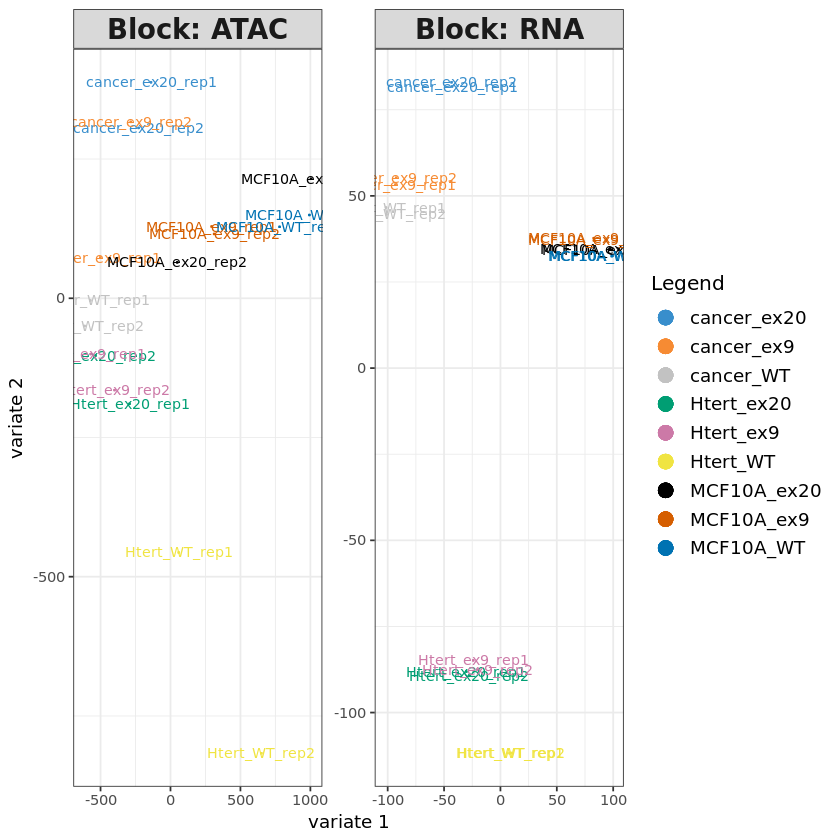

In [24]:
plotIndiv(Diablo_Result_Total,
         legend = TRUE,
         )

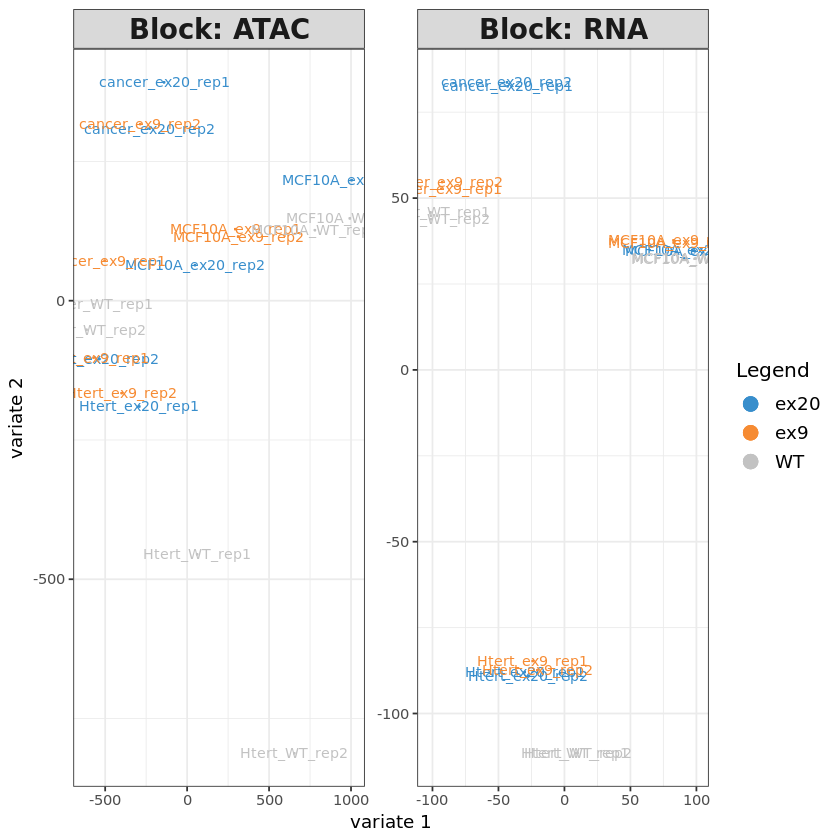

In [25]:
plotIndiv(Diablo_Result_Geno,
         legend = TRUE)

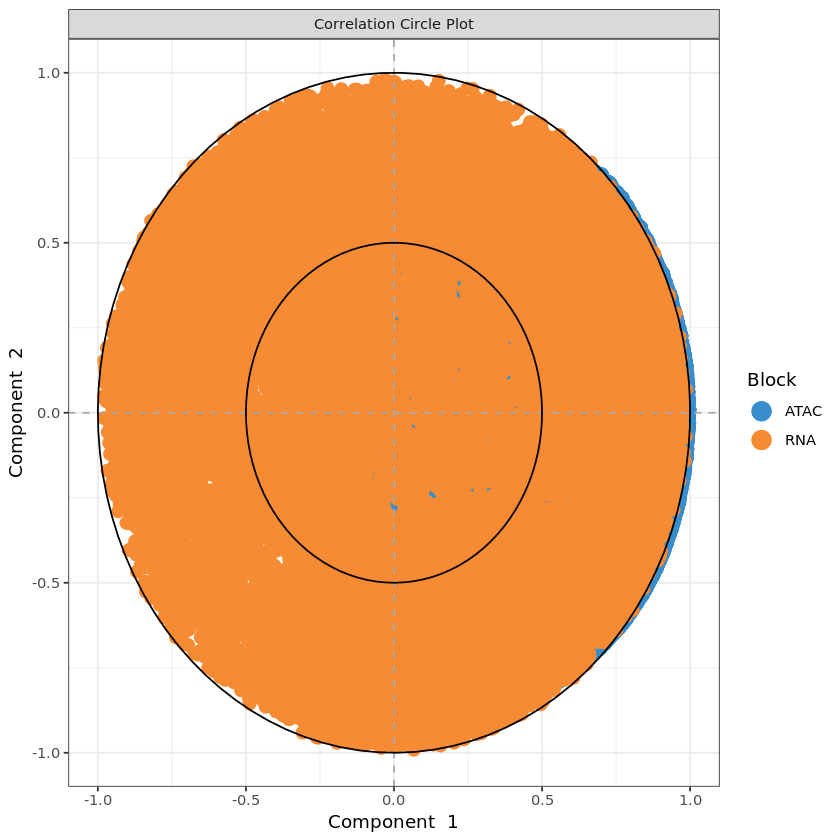

In [26]:
plotVar(Diablo_Result_Geno,
       legend = TRUE,
       pch=c(20,20))

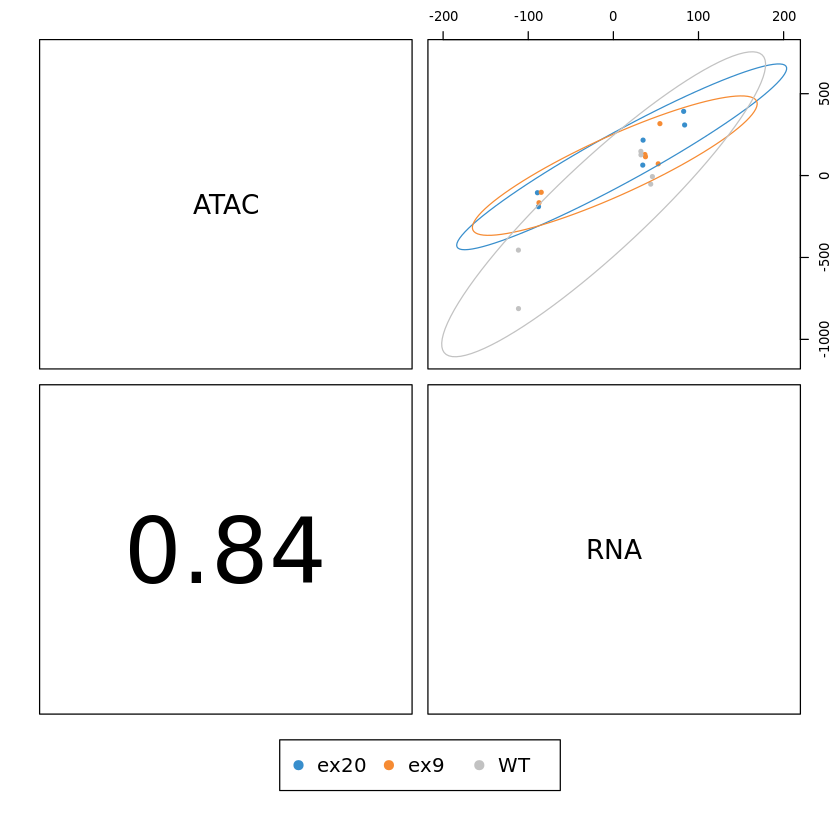

In [27]:
plotDiablo(Diablo_Result_Geno, ncomp = 2)

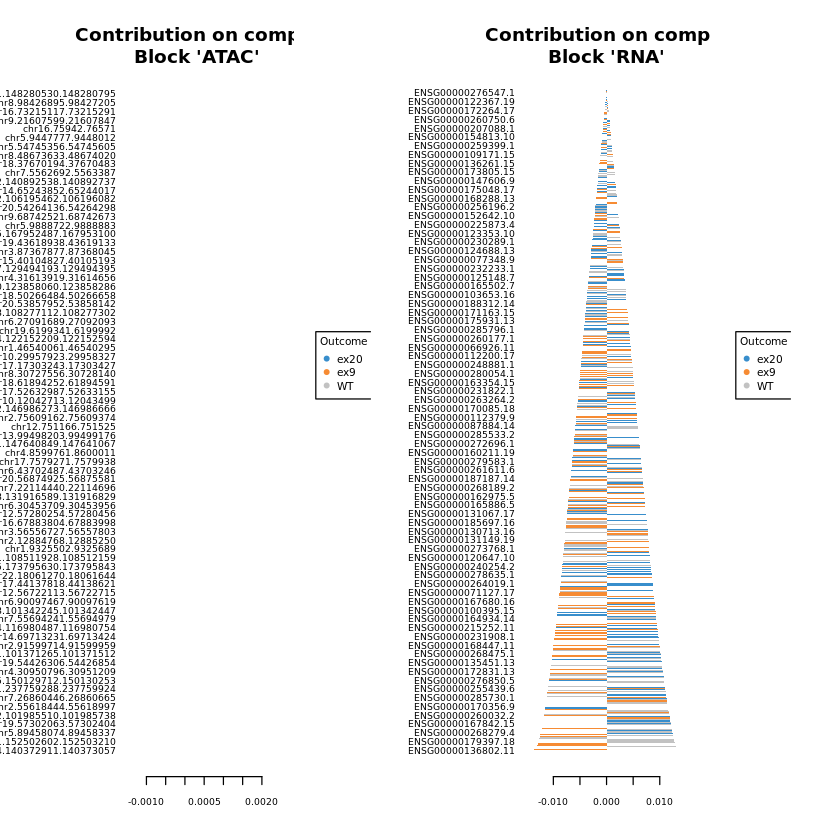

In [28]:
plotLoadings(Diablo_Result_Geno, comp = 1, contrib = "max")

In [29]:
set.seed(123) # for reproducibility in this vignette
MyPerf.diablo <- perf(Diablo_Result_Geno, validation = 'Mfold', folds = 5, 
                   nrepeat = 10, 
                   dist = 'centroids.dist')

In [30]:
MyPerf.diablo


Call:
 perf.sgccda(object = Diablo_Result_Geno, dist = "centroids.dist", validation = "Mfold", folds = 5, nrepeat = 10) 

 Main numerical outputs: 
 -------------------- 
 Error rate (overall or BER) for each component and for each distance: see object$error.rate 
 Error rate per class, for each component and for each distance: see object$error.rate.class 
 Prediction values for each component: see object$predict 
 Classification of each sample, for each component and for each distance: see object$class 
 Stable features on each component: see object$features$stable 
 AUC values: see object$auc if auc = TRUE 

 Visualisation Functions: 
 -------------------- 
 plot 

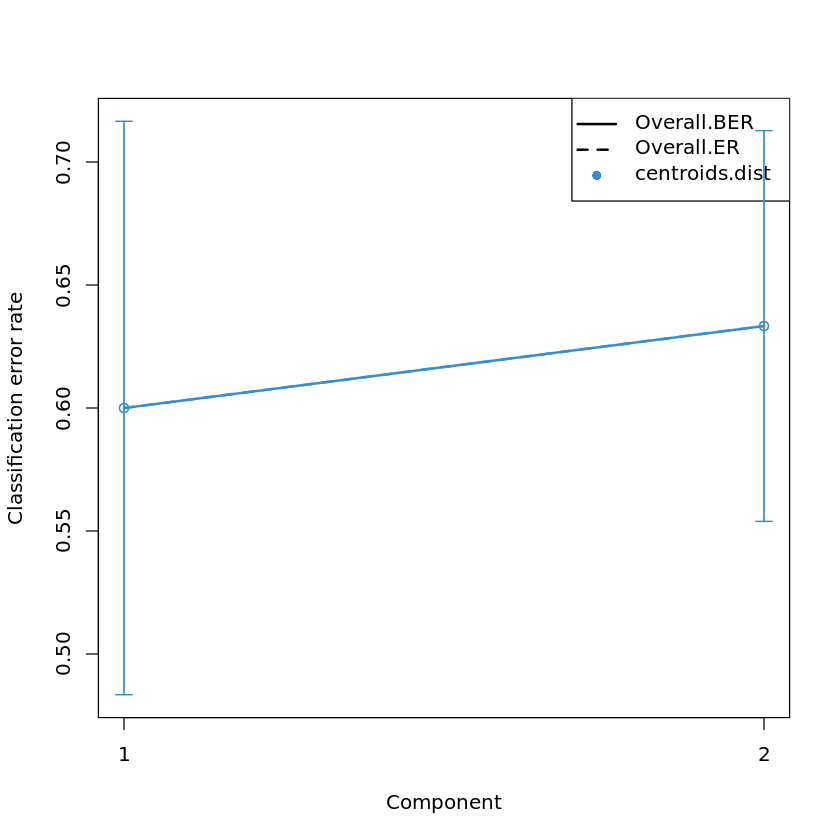

In [31]:
plot(MyPerf.diablo)

In [32]:
MyPerf.diablo$MajorityVote.error.rate

,comp1,comp2
ex20,0.9500000,0.9833333
ex9,0.8333333,0.9666667
WT,0.9000000,0.9333333
Overall.ER,0.8944444,0.9611111
Overall.BER,0.8944444,0.9611111


In [33]:
MyPerf.diablo$choice.ncomp$WeightedVote

,centroids.dist
Overall.ER,1
Overall.BER,1


Let's try using only genes with symbols

In [34]:
colnames(NormCounts_RNA_Clean)

[1] "ENSG00000227232.5"  "ENSG00000278267.1"  "ENSG00000233750.3" 
    [4] "ENSG00000268903.1"  "ENSG00000269981.1"  "ENSG00000241860.7" 
    [7] "ENSG00000279457.4"  "ENSG00000228463.10" "ENSG00000237094.12"
   [10] "ENSG00000230021.10" "ENSG00000225630.1"  "ENSG00000237973.1" 
   [13] "ENSG00000248527.1"  "ENSG00000228327.3"  "ENSG00000237491.10"
   [16] "ENSG00000230092.7"  "ENSG00000177757.2"  "ENSG00000228794.9" 
   [19] "ENSG00000225880.5"  "ENSG00000230699.2"  "ENSG00000223764.2" 
   [22] "ENSG00000187634.12" "ENSG00000188976.11" "ENSG00000187961.14"
   [25] "ENSG00000187583.11" "ENSG00000187642.9"  "ENSG00000272512.1" 
   [28] "ENSG00000188290.10" "ENSG00000187608.10" "ENSG00000188157.15"
   [31] "ENSG00000242590.1"  "ENSG00000217801.10" "ENSG00000273443.1" 
   [34] "ENSG00000237330.3"  "ENSG00000131591.17" "ENSG00000285812.1" 
   [37] "ENSG00000272141.1"  "ENSG00000078808.17" "ENSG00000176022.7" 
   [40] "ENSG00000184163.3"  "ENSG00000260179.1"  "ENSG00000160087.20"
   [43] "ENSG00000230415.1"  "ENSG00000162572.21" "ENSG00000131584.19"
   [46] "ENSG00000169972.12" "ENSG00000127054.20" "ENSG00000283712.1" 
   [49] "ENSG00000240731.1"  "ENSG00000224051.7"  "ENSG00000169962.5" 
   [52] "ENSG00000107404.20" "ENSG00000162576.16" "ENSG00000175756.13"
   [55] "ENSG00000221978.12" "ENSG00000224870.7"  "ENSG00000242485.6" 
   [58] "ENSG00000264293.2"  "ENSG00000272455.1"  "ENSG00000235098.8" 
   [61] "ENSG00000179403.12" "ENSG00000215915.10" "ENSG00000160072.20"
   [64] "ENSG00000284740.1"  "ENSG00000197785.14" "ENSG00000205090.9" 
   [67] "ENSG00000160075.12" "ENSG00000215014.5"  "ENSG00000228594.4" 
   [70] "ENSG00000286989.1"  "ENSG00000272106.1"  "ENSG00000197530.12"
   [73] "ENSG00000248333.8"  "ENSG00000272004.1"  "ENSG00000189339.12"
   [76] "ENSG00000269737.2"  "ENSG00000008128.23" "ENSG00000268575.1" 
   [79] "ENSG00000227775.3"  "ENSG00000215790.7"  "ENSG00000008130.15"
   [82] "ENSG00000078369.18" "ENSG00000231050.1"  "ENSG00000178821.13"
   [85] "ENSG00000067606.17" "ENSG00000271806.1"  "ENSG00000182873.5" 
   [88] "ENSG00000162585.17" "ENSG00000157933.10" "ENSG00000287356.1" 
   [91] "ENSG00000116151.14" "ENSG00000269896.2"  "ENSG00000272420.1" 
   [94] "ENSG00000157916.20" "ENSG00000157911.10" "ENSG00000149527.18"
   [97] "ENSG00000157881.15" "ENSG00000238164.6"  "ENSG00000157873.17"
  [100] "ENSG00000157870.16" "ENSG00000130762.15" "ENSG00000162591.16"
  [103] "ENSG00000158109.15" "ENSG00000116213.16" "ENSG00000078900.15"
  [106] "ENSG00000227372.12" "ENSG00000162592.10" "ENSG00000235169.8" 
  [109] "ENSG00000130764.10" "ENSG00000272153.1"  "ENSG00000116198.13"
  [112] "ENSG00000169598.15" "ENSG00000198912.11" "ENSG00000236423.6" 
  [115] "ENSG00000131697.18" "ENSG00000069424.15" "ENSG00000116254.18"
  [118] "ENSG00000285629.1"  "ENSG00000116251.11" "ENSG00000226944.1" 
  [121] "ENSG00000158286.13" "ENSG00000116237.16" "ENSG00000225077.3" 
  [124] "ENSG00000158292.7"  "ENSG00000097021.19" "ENSG00000271746.1" 
  [127] "ENSG00000069812.11" "ENSG00000187017.17" "ENSG00000231868.1" 
  [130] "ENSG00000215788.10" "ENSG00000171680.22" "ENSG00000162408.11"
  [133] "ENSG00000229519.2"  "ENSG00000204859.13" "ENSG00000162413.16"
  [136] "ENSG00000116273.6"  "ENSG00000041988.15" "ENSG00000007923.16"
  [139] "ENSG00000237436.1"  "ENSG00000171735.19" "ENSG00000049245.13"
  [142] "ENSG00000269925.1"  "ENSG00000049246.14" "ENSG00000236266.1" 
  [145] "ENSG00000049247.13" "ENSG00000116288.13" "ENSG00000284747.1" 
  [148] "ENSG00000116285.13" "ENSG00000162426.14" "ENSG00000142599.19"
  [151] "ENSG00000074800.16" "ENSG00000274258.1"  "ENSG00000230679.1" 
  [154] "ENSG00000142583.18" "ENSG00000180758.12" "ENSG00000228526.7" 
  [157] "ENSG00000234546.4"  "ENSG00000049239.12" "ENSG00000171621.14"
  [160] "ENSG00000284693.1"  "ENSG00000171612.7"  "ENSG00000188807.13"
  [163] "ENSG00000171608.16" "ENSG00000231789.2"  "ENSG00000171603.17"
  [166] "ENSG00000178585.15" "ENSG00000223989.1"  "ENSG00000162441.12"
  [169] "ENSG00000228150.1" 

In [35]:
library(org.Hs.eg.db)
gene_list <- colnames(NormCounts_RNA_Clean)
  ens.str <- substr(x = gene_list, 1 , 15)
  symbol_list <- mapIds(org.Hs.eg.db,
                       keys = ens.str,
                       column = "SYMBOL",
                       keytype = "ENSEMBL",
                       multiVals= "first")
colnames(NormCounts_RNA_Clean) <- symbol_list

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, ta

In [36]:
NormCounts_RNA_Clean_Symbols <- NormCounts_RNA_Clean
NormCounts_RNA_Clean_Symbols

,NA,MIR6859-1,NA,NA,NA,NA,NA,NA,NA,LOC101928626,⋯,ND4,NA,NA,NA,ND5,ND6,NA,CYTB,NA,NA
cancer_ex20_rep1,186.36518,47.05259,62.73679,141.15778,136.54479,63.659393,364.4270,48.89779,203.89458,165.14538,⋯,99471.95,1853.5032,2530.6915,2275.1314,94980.74,20272.288,985.3367,87222.59,833.1077,3058.419
cancer_ex20_rep2,143.41866,22.35096,17.69451,79.15965,81.95352,31.663861,331.5392,21.41967,65.19030,86.60997,⋯,55172.41,1179.9445,1492.8579,1328.9509,52977.36,9157.375,447.9505,60416.51,653.7656,3011.792
cancer_ex9_rep1,241.81679,26.59985,14.50901,105.59333,74.96320,28.211958,372.3979,28.21196,112.04178,66.90264,⋯,61044.23,642.4266,754.4684,607.7662,49123.47,8507.115,451.3913,41960.85,660.9659,1828.941
cancer_ex9_rep2,276.37993,33.96194,16.39542,104.22802,100.71472,40.988549,482.4938,28.10643,156.92759,86.66150,⋯,54458.56,603.1172,714.3718,596.0906,43473.63,6158.822,228.3648,38858.32,522.3112,1685.215
cancer_WT_rep1,216.63322,35.07395,15.47380,141.32738,109.34819,37.137123,434.2980,34.04236,144.42214,87.68487,⋯,83264.52,1022.3025,1194.5774,936.6808,67942.37,11153.516,512.6986,58583.81,806.7008,1885.741
cancer_WT_rep2,227.09553,43.16692,10.32252,135.13122,88.21066,43.166919,473.8977,41.29010,122.93188,76.94973,⋯,88326.09,1128.9088,1412.3090,1163.6300,71328.64,12340.108,628.7356,60113.69,869.9073,2150.839
Htert_ex20_rep1,118.61672,33.89049,29.65418,66.36888,50.83574,39.538906,200.5187,12.70893,118.61672,148.27090,⋯,48309.48,1443.1701,1732.6514,1491.1816,57793.17,10268.819,732.8819,41690.95,1623.9194,2006.599
Htert_ex20_rep2,100.60336,21.11429,32.29244,37.26050,50.92269,48.438655,188.7866,23.59832,84.45714,111.78151,⋯,46727.16,1274.3092,1781.0521,1489.1781,58379.76,10016.865,765.0823,43641.99,1608.4117,2048.086
Htert_ex9_rep1,95.08388,17.82823,19.01678,58.23887,49.91903,4.754194,184.2250,11.88548,48.73049,86.76404,⋯,69109.34,1183.7942,1681.7960,1482.1199,78093.58,13487.648,673.9070,40535.44,1328.7972,2745.547
Htert_ex9_rep2,127.32394,16.60747,15.50031,36.53644,29.89345,15.500306,159.4317,18.82180,55.35824,104.07348,⋯,46837.50,955.4831,1169.1659,987.5909,49958.59,7346.038,449.5089,31271.87,1381.7416,3003.738


In [37]:
NormCounts_RNAcleanSymbols_filt <- as.data.frame(NormCounts_RNA_Clean_Symbols)
NormCounts_RNAcleanSymbols_filt
NormCounts_RNAcleanSymbols_filt <- NormCounts_RNAcleanSymbols_filt[!is.na(names(NormCounts_RNAcleanSymbols_filt))]
NormCounts_RNAcleanSymbols_filt

,NA,MIR6859-1,NA.1,NA.2,NA.3,NA.4,NA.5,NA.6,NA.7,LOC101928626,⋯,ND4,NA,NA.1,NA.2,ND5,ND6,NA.3,CYTB,NA.4,NA.5
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cancer_ex20_rep1,186.36518,47.05259,62.73679,141.15778,136.54479,63.659393,364.4270,48.89779,203.89458,165.14538,⋯,99471.95,1853.5032,2530.6915,2275.1314,94980.74,20272.288,985.3367,87222.59,833.1077,3058.419
cancer_ex20_rep2,143.41866,22.35096,17.69451,79.15965,81.95352,31.663861,331.5392,21.41967,65.19030,86.60997,⋯,55172.41,1179.9445,1492.8579,1328.9509,52977.36,9157.375,447.9505,60416.51,653.7656,3011.792
cancer_ex9_rep1,241.81679,26.59985,14.50901,105.59333,74.96320,28.211958,372.3979,28.21196,112.04178,66.90264,⋯,61044.23,642.4266,754.4684,607.7662,49123.47,8507.115,451.3913,41960.85,660.9659,1828.941
cancer_ex9_rep2,276.37993,33.96194,16.39542,104.22802,100.71472,40.988549,482.4938,28.10643,156.92759,86.66150,⋯,54458.56,603.1172,714.3718,596.0906,43473.63,6158.822,228.3648,38858.32,522.3112,1685.215
cancer_WT_rep1,216.63322,35.07395,15.47380,141.32738,109.34819,37.137123,434.2980,34.04236,144.42214,87.68487,⋯,83264.52,1022.3025,1194.5774,936.6808,67942.37,11153.516,512.6986,58583.81,806.7008,1885.741
cancer_WT_rep2,227.09553,43.16692,10.32252,135.13122,88.21066,43.166919,473.8977,41.29010,122.93188,76.94973,⋯,88326.09,1128.9088,1412.3090,1163.6300,71328.64,12340.108,628.7356,60113.69,869.9073,2150.839
Htert_ex20_rep1,118.61672,33.89049,29.65418,66.36888,50.83574,39.538906,200.5187,12.70893,118.61672,148.27090,⋯,48309.48,1443.1701,1732.6514,1491.1816,57793.17,10268.819,732.8819,41690.95,1623.9194,2006.599
Htert_ex20_rep2,100.60336,21.11429,32.29244,37.26050,50.92269,48.438655,188.7866,23.59832,84.45714,111.78151,⋯,46727.16,1274.3092,1781.0521,1489.1781,58379.76,10016.865,765.0823,43641.99,1608.4117,2048.086
Htert_ex9_rep1,95.08388,17.82823,19.01678,58.23887,49.91903,4.754194,184.2250,11.88548,48.73049,86.76404,⋯,69109.34,1183.7942,1681.7960,1482.1199,78093.58,13487.648,673.9070,40535.44,1328.7972,2745.547


,MIR6859-1,LOC101928626,LINC01409,FAM87B,LINC01128,LINC00115,LINC02593,SAMD11,NOC2L,KLHL17,⋯,COX2,ATP8,ATP6,COX3,ND3,ND4L,ND4,ND5,ND6,CYTB
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cancer_ex20_rep1,47.05259,165.14538,349.66536,60.89159,912.4513,87.64699,1465.088642,2498.401,10773.20,1020.3955,⋯,80187.77,13040.950,67233.55,140575.62,13863.909,18098.642,99471.95,94980.74,20272.288,87222.59
cancer_ex20_rep2,22.35096,86.60997,131.31189,34.45773,765.5204,50.28966,1142.692852,2817.152,13457.14,919.1832,⋯,59768.33,5755.372,38149.36,111479.14,8494.296,9729.187,55172.41,52977.36,9157.375,60416.51
cancer_ex9_rep1,26.59985,66.90264,153.95669,25.79379,508.6213,48.36336,364.337291,2872.783,16359.71,1383.9981,⋯,76593.05,6864.373,36443.40,54006.55,6102.650,9268.837,61044.23,49123.47,8507.115,41960.85
cancer_ex9_rep2,33.96194,86.66150,172.15190,52.69956,544.5621,57.38397,393.490067,3060.088,16186.96,1361.9909,⋯,67297.34,5628.313,30250.72,51001.47,4758.185,7386.136,54458.56,43473.63,6158.822,38858.32
cancer_WT_rep1,35.07395,87.68487,274.40207,45.38982,652.9944,52.61092,700.447398,3264.972,18888.35,1636.0966,⋯,103692.00,9366.808,49330.48,80556.61,6086.362,12063.375,83264.52,67942.37,11153.516,58583.81
cancer_WT_rep2,43.16692,76.94973,227.09553,47.85898,642.8117,72.25767,670.964067,3196.229,17896.44,1565.2700,⋯,109864.50,10584.341,52506.93,85105.46,6904.830,12579.403,88326.09,71328.64,12340.108,60113.69
Htert_ex20_rep1,33.89049,148.27090,218.87609,73.42940,1492.5937,91.78675,0.000000,1533.545,13957.23,796.4265,⋯,31792.10,4521.556,21719.57,60651.27,4442.479,8290.461,48309.48,57793.17,10268.819,41690.95
Htert_ex20_rep2,21.11429,111.78151,170.15630,63.34286,1433.2874,57.13277,9.936134,1659.334,13891.96,818.4891,⋯,36297.94,4396.739,23626.89,65311.45,4533.361,8537.623,46727.16,58379.76,10016.865,43641.99
Htert_ex9_rep1,17.82823,86.76404,116.47775,67.74726,1112.4813,16.63968,0.000000,1492.817,12769.76,436.1973,⋯,56863.72,5337.771,26770.87,44093.96,5551.710,10529.351,69109.34,78093.58,13487.648,40535.44


In [38]:
NormCounts_RNAcleanSymbols_filt <- as.matrix(NormCounts_RNAcleanSymbols_filt)
NormCounts_RNAcleanSymbols_filt

,MIR6859-1,LOC101928626,LINC01409,FAM87B,LINC01128,LINC00115,LINC02593,SAMD11,NOC2L,KLHL17,⋯,COX2,ATP8,ATP6,COX3,ND3,ND4L,ND4,ND5,ND6,CYTB
cancer_ex20_rep1,47.05259,165.14538,349.66536,60.89159,912.4513,87.64699,1465.088642,2498.401,10773.20,1020.3955,⋯,80187.77,13040.950,67233.55,140575.62,13863.909,18098.642,99471.95,94980.74,20272.288,87222.59
cancer_ex20_rep2,22.35096,86.60997,131.31189,34.45773,765.5204,50.28966,1142.692852,2817.152,13457.14,919.1832,⋯,59768.33,5755.372,38149.36,111479.14,8494.296,9729.187,55172.41,52977.36,9157.375,60416.51
cancer_ex9_rep1,26.59985,66.90264,153.95669,25.79379,508.6213,48.36336,364.337291,2872.783,16359.71,1383.9981,⋯,76593.05,6864.373,36443.40,54006.55,6102.650,9268.837,61044.23,49123.47,8507.115,41960.85
cancer_ex9_rep2,33.96194,86.66150,172.15190,52.69956,544.5621,57.38397,393.490067,3060.088,16186.96,1361.9909,⋯,67297.34,5628.313,30250.72,51001.47,4758.185,7386.136,54458.56,43473.63,6158.822,38858.32
cancer_WT_rep1,35.07395,87.68487,274.40207,45.38982,652.9944,52.61092,700.447398,3264.972,18888.35,1636.0966,⋯,103692.00,9366.808,49330.48,80556.61,6086.362,12063.375,83264.52,67942.37,11153.516,58583.81
cancer_WT_rep2,43.16692,76.94973,227.09553,47.85898,642.8117,72.25767,670.964067,3196.229,17896.44,1565.2700,⋯,109864.50,10584.341,52506.93,85105.46,6904.830,12579.403,88326.09,71328.64,12340.108,60113.69
Htert_ex20_rep1,33.89049,148.27090,218.87609,73.42940,1492.5937,91.78675,0.000000,1533.545,13957.23,796.4265,⋯,31792.10,4521.556,21719.57,60651.27,4442.479,8290.461,48309.48,57793.17,10268.819,41690.95
Htert_ex20_rep2,21.11429,111.78151,170.15630,63.34286,1433.2874,57.13277,9.936134,1659.334,13891.96,818.4891,⋯,36297.94,4396.739,23626.89,65311.45,4533.361,8537.623,46727.16,58379.76,10016.865,43641.99
Htert_ex9_rep1,17.82823,86.76404,116.47775,67.74726,1112.4813,16.63968,0.000000,1492.817,12769.76,436.1973,⋯,56863.72,5337.771,26770.87,44093.96,5551.710,10529.351,69109.34,78093.58,13487.648,40535.44
Htert_ex9_rep2,16.60747,104.07348,101.85915,83.03735,1102.7361,33.21494,2.214329,1238.917,11069.43,488.2596,⋯,33420.87,2857.592,15956.46,41391.35,3435.532,7606.222,46837.50,49958.59,7346.038,31271.87


In [39]:
multiOmics_List2 <- list(ATAC = ATACPeaks_sorted, 
                         RNA = NormCounts_RNAcleanSymbols_filt)
str(multiOmics_List2)

List of 2
 $ ATAC: int [1:18, 1:549861] 421 369 23 151 13 0 57 14 28 204 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:18] "cancer_ex20_rep1" "cancer_ex20_rep2" "cancer_ex9_rep1" "cancer_ex9_rep2" ...
  .. ..$ : chr [1:549861] "chr1.9958.10487" "chr1.180758.180998" "chr1.181414.181571" "chr1.267951.268112" ...
 $ RNA : num [1:18, 1:15912] 47.1 22.4 26.6 34 35.1 ...
  ..- attr(*, "dimnames")=List of 2
  .. ..$ : chr [1:18] "cancer_ex20_rep1" "cancer_ex20_rep2" "cancer_ex9_rep1" "cancer_ex9_rep2" ...
  .. ..$ : chr [1:15912] "MIR6859-1" "LOC101928626" "LINC01409" "FAM87B" ...


In [40]:
Diablo_Result_Geno2 <- block.splsda(multiOmics_List2, 
                                   SampleClass_Geno)

In [41]:
plotLoadings(Diablo_Result_Geno2, comp = 1, contrib = "max")

In [42]:
library(repr)
pdf(file = "DiabloWeights.pdf",
   width = 12,
   height = 12)
options(repr.plot.width=12, repr.plot.height=12)
plotLoadings(Diablo_Result_Geno2, comp = 1, contrib = "max")
dev.off()

png 
  2